In [1]:
# w = 15 로 돌려보자
# lr = 0.0001
# lambda_1 = 0.01

In [2]:
# 모듈 import
from datetime import datetime
import numpy as np
import os
import pandas as pd

#from google.colab import drive
#drive.mount('/content/gdrive')
#os.chdir('/content/gdrive/MyDrive/python/python_dong/data_axis_transform1')

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.autograd import Variable

#!pip install torchmetrics
import torchmetrics

#!pip install torchinfo
from torchinfo import summary

import matplotlib.pyplot as plt
import math


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



# 1. 데이터 전처리

In [3]:
# data path 지정
raw_data_path = './data/stocknet-dataset/price/raw'

if 'stocknet' in raw_data_path:
    tra_date = '2014-01-02'
    val_date = '2015-08-03'
    tes_date = '2015-10-01'
    end_date = '2015-12-31'
elif 'kdd17' in raw_data_path:
    tra_date = '2007-01-03'
    val_date = '2015-01-02'
    tes_date = '2016-01-04'
    end_date = '2016-12-31'
else:
    print('unexpected path: %s' % raw_data_path)

# os.path.isfile : 파일이 있는지 없는 지 체크
# os.path.join(data_path, fname) : 폴더 디렉터리와 fname(stockname.csv) 붙임
fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

COLUMNS_FEATURE_DATA_V1 = ['open_close_ratio', 'high_close_ratio', 
                           'low_close_ratio', 'close_lastclose_ratio', 
                           'adjclose_lastadjclose_ratio', 'close_ma5_ratio', 
                           'close_ma10_ratio', 'close_ma15_ratio', 'close_ma20_ratio', 
                           'close_ma25_ratio', 'close_ma30_ratio']

ver = 'v1' # ver in ['v1', 'v2']
if ver == 'v1':
    COLUMNS_FEATURE = COLUMNS_FEATURE_DATA_V1

In [4]:
windows = [5,10,15,20,25,30]

def preprocess(df, windows):
   '''
   전처리 함수 역할 : 전체 feature생성하여 df column에 추가
   '''
   data = df
   data['open_close_ratio'] = data['Open'] / data['Close'] - 1
   data['high_close_ratio'] = data['High'] / data['Close'] - 1
   data['low_close_ratio'] = data['Low'] / data['Close'] - 1

   data['close_lastclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'close_lastclose_ratio'] = data['Close'][1:].values / data['Close'][:-1].values - 1

   data['adjclose_lastadjclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'adjclose_lastadjclose_ratio'] = data['Adj Close'][1:].values / data['Adj Close'][:-1].values - 1

   for window in windows:
      data[f'close_ma{window}_ratio'] = data['Adj Close'].rolling(window).mean()/data['Adj Close'] - 1
   
   data['label'] = np.append((data['Close'][1:].values > data['Close'][:-1].values)*1,0)

   return data

In [5]:
feature_data_path = './data/stocknet-dataset/price/feature'

for fname in fnames:
   if not os.path.isfile(os.path.join(feature_data_path,fname)):
      df_raw = pd.read_csv(os.path.join(raw_data_path,fname))
      data = preprocess(df_raw, windows)

      # 폴더 없으면 생성
      try:
         if not os.path.exists(feature_data_path):
            os.makedirs(feature_data_path)
      except OSError:
         print ('Error: Creating directory. ' +  feature_data_path)

      #csv 파일 저장
      data.to_csv(os.path.join(feature_data_path,fname))



# train, validation, test data 나누기

## 1. input data 3차원으로 쌓기
shape = (stock 종류수, date, feature)



요건
1. 모든 티커 데이터의 date가 맞는지?
2. 결측치는 없는지?
3. 티커와 데이터 메치 가능해야함

In [6]:
raw_data_path = './data/stocknet-dataset/price/raw'


tra_data_X = []
tra_data_Y = []
val_data_X = []
val_data_Y = []
test_data_X = []
test_data_Y = []
tickers = []

cnt = 0
fail_cnt = 0

fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

for fname in fnames:

    df = pd.read_csv(os.path.join(raw_data_path,fname))
    data = preprocess(df, windows)

    learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
    tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
    tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

    val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
    val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label']

    test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
    test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']


    if cnt == 0:
        target_dates = learning_data
    
    print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
    if np.array_equal(target_dates.values, learning_data.values): 
        
        tra_data_X.append(tra_data_X_ticker.values)
        tra_data_Y.append(tra_data_Y_ticker.values)

        val_data_X.append(val_data_X_ticker.values)
        val_data_Y.append(val_data_Y_ticker.values)
        
        test_data_X.append(test_data_X_ticker.values)
        test_data_Y.append(test_data_Y_ticker.values)

        tickers.append(fname)
    else : 
        fail_cnt += 1
    
    cnt += 1

print(cnt, len(fnames))
print('fail_cnt :', fail_cnt)

# 마지막에 index 종목 넣기
raw_data_index_path = './data/stocknet-dataset/price/raw/index'

fname = os.listdir(raw_data_index_path)[0]

df = pd.read_csv(os.path.join(raw_data_index_path,fname))
data = preprocess(df, windows)

learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label']

test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']

print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
if np.array_equal(target_dates.values, learning_data.values):
    
    tra_data_X.append(tra_data_X_ticker.values)
    # tra_data_Y.append(tra_data_Y_ticker.values)

    val_data_X.append(val_data_X_ticker.values)
    # val_data_Y.append(val_data_Y_ticker.values)
    
    test_data_X.append(test_data_X_ticker.values)
    # test_data_Y.append(test_data_Y_ticker.values)

    tickers.append(fname)

# tra_data_X

ticker : AAPL.csv, date check : True
ticker : ABB.csv, date check : True
ticker : ABBV.csv, date check : True
ticker : AEP.csv, date check : True
ticker : AGFS.csv, date check : False
ticker : AMGN.csv, date check : True
ticker : AMZN.csv, date check : True
ticker : BA.csv, date check : True
ticker : BABA.csv, date check : False
ticker : BAC.csv, date check : True
ticker : BBL.csv, date check : True
ticker : BCH.csv, date check : True
ticker : BHP.csv, date check : True
ticker : BP.csv, date check : True
ticker : BRK-A.csv, date check : True
ticker : BSAC.csv, date check : True
ticker : BUD.csv, date check : True
ticker : C.csv, date check : True
ticker : CAT.csv, date check : True
ticker : CELG.csv, date check : True
ticker : CHL.csv, date check : True
ticker : CHTR.csv, date check : True
ticker : CMCSA.csv, date check : True
ticker : CODI.csv, date check : True
ticker : CSCO.csv, date check : True
ticker : CVX.csv, date check : True
ticker : D.csv, date check : True
ticker : DHR.csv,

In [7]:
def list_to_tensor(list_):
    return torch.Tensor(np.array(list_))

In [8]:
tensor_tra_data_X = list_to_tensor(tra_data_X)
tensor_tra_data_Y = list_to_tensor(tra_data_Y).view((len(tra_data_Y),-1,1))
tensor_val_data_X = list_to_tensor(val_data_X)
tensor_val_data_Y = list_to_tensor(val_data_Y).view((len(val_data_Y),-1,1))
tensor_test_data_X = list_to_tensor(test_data_X)
tensor_test_data_Y = list_to_tensor(test_data_Y).view((len(test_data_Y),-1,1))

## Hyperparameter setting

In [10]:
w = 15 # window size w in {10, 15}
beta = 0.01 # market context weight beta in {0.01, 0.1, 1}
h = 64 # hidden layer size h in {64, 128}
learning_rate = 0.0001 # in {0.001, 0.0001}
lambda_1 = 0.01 # selective regularzation lambda = 1
drop_rate = 0.15
feature_size = len(COLUMNS_FEATURE)

In [11]:
class Feature_transformation_layer(nn.Module):
    """Feature transformation layer in DTML"""

    def __init__(self, feature_size, h):
        super(Feature_transformation_layer, self).__init__()
        self.feature_size = feature_size
        self.h = h

        self.linear = nn.Linear(self.feature_size, self.h)
    
    def forward(self, X):
        output = torch.tanh(self.linear(X))
        return output

In [12]:
def layer_normalization(tensor):
    h = tensor.size()[-1]
    return (tensor - torch.std_mean(tensor, dim=1, unbiased=False)[1].repeat((h,1)).transpose(-2,-1))/torch.std_mean(tensor, dim=1, unbiased=False)[0].repeat((h,1)).transpose(-2,-1)

In [13]:
class Nonlinear_transformation(nn.Module):
    """Nonlinear transformation in DTML"""

    def __init__(self, h):
        super(Nonlinear_transformation, self).__init__()
        self.h = h


        self.mlp1 = nn.Linear(self.h, self.h * 4)
        self.mlp2 = nn.Linear(self.h * 4, h)
    
    def forward(self, H, H_tilda, on_train=True):
        H_p = H + H_tilda
        H_p = self.mlp1(H_p)
        H_p = nn.ReLU()(H_p)
        H_p = self.mlp2(H_p)
        H_p = H + H_tilda + H_p
        H_p = nn.Tanh()(H_p)

        # dropout and layer normalization
        if on_train == True:
            H_p = nn.Dropout(p=drop_rate)(H_p)
        H_p = layer_normalization(H_p)
        return H_p

In [14]:
class Final_prediction(nn.Module):
    """final prediction in DTML"""

    def __init__(self, h):
        super(Final_prediction, self).__init__()
        self.h = h

        self.pred_linear = nn.Linear(h,1)
    
    def forward(self, H_p):
        y_hat = self.pred_linear(H_p)
        y_hat = nn.Sigmoid()(y_hat).view((-1))

        return y_hat

In [19]:
class DTML(nn.Module):
    ''' DTML '''

    def __init__(self, X, y, w, h, beta, vali_X, vali_y, test_X, test_y,
                 batch_size,
                 learning_rate, epochs):
        """ Initialize """
        super(DTML, self).__init__()
        self.X = X
        self.y = y
        self.vali_X = vali_X
        self.vali_y = vali_y
        self.test_X = test_X
        self.test_y = test_y
        self.w = w
        self.h = h
        self.beta = beta
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.train_timesteps = train_timesteps = int(X.size()[1]) - w

        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        print("==> Use accelerator : ", self.device)

        self.Feature_transformation_layer = Feature_transformation_layer(feature_size=self.X.size()[-1],
                                                                         h=self.h)
        
        # 티커별로 lstm 층 개별로 만들기
        for i in range(self.X.size()[0]): # 마지막은 index용 lstm
            self._modules['lstm_{}'.format(i)] = nn.LSTM(input_size = self.h, hidden_size=self.h, batch_first=True)
        
        # ticker별로 linear layer 생성
        for i in range(self.X.size()[0]):
            self._modules['ContextNormalLinearLayer_{}'.format(i)] = nn.Linear(h, h)

        self.multihead_attn = nn.MultiheadAttention(embed_dim=self.h, num_heads=8, dropout=drop_rate)
        self.query_layer = nn.Linear(self.h, self.h)
        self.key_layer = nn.Linear(self.h, self.h)
        self.value_layer = nn.Linear(self.h, self.h)

        self.Nonlinear_transformation = Nonlinear_transformation(h=self.h)

        self.Final_prediction = Final_prediction(h=self.h)

        # Loss funciton
        self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(params=self.parameters(), lr=self.learning_rate)

    def window_(self, tensor, time_idx, window_size):
        # tensor size = (ticker_number, dates, feature_size)    
        return tensor[:, time_idx:time_idx + self.w, :]


    def train(self):
        mode = 'train'
        if mode == 'train':
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            

        timesteps = int(X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.iter_losses = np.zeros(epochs * iter_per_epoch)
        self.iter_acc = np.zeros(epochs * iter_per_epoch)
        self.iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.iter_precision = np.zeros(epochs * iter_per_epoch)
        self.return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_com_return_rate = np.zeros((epochs, timesteps))

        # epoch당 loss
        self.epoch_losses = np.zeros(epochs)
        self.epoch_acc = np.zeros(epochs)
        self.epoch_mcc = np.zeros(epochs)
        self.epoch_precision = np.zeros(epochs)

        # epoch당 loss (Validation)
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)

        vali_timesteps = int(self.vali_X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))

        train_n_iter = 0

        for epoch in range(self.epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.index_return_rate[epoch, time_idx] = index_return_rate
                self.com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.index_com_return_rate[epoch, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                train_n_iter += 1                

                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.epoch_losses[epoch] = np.mean(self.iter_losses[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_acc[epoch] = np.mean(self.iter_acc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_mcc[epoch] = np.mean(self.iter_mcc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_precision[epoch] = np.mean(self.iter_precision[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.com_return_rate[epoch][:timesteps], label='portfolio')
            plt.plot(range(timesteps), self.index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()

            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.epoch_losses[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.epoch_acc[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.show()

            if epoch % 1 == 0:
                print("Epochs : ", epoch, "Iterations : ", train_n_iter,
                      "Loss : ", self.epoch_losses[epoch],
                      "ACC : ", self.epoch_acc[epoch],
                      "MCC : ", self.epoch_mcc[epoch],
                      "Precision : ", self.epoch_precision[epoch])
            
            if epoch % 1 == 0:
                self.validation(e=epoch)




            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.vali_epoch_losses[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.vali_epoch_acc[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.show()
    
    def validation(self , e):
        mode = 'validation'
        if mode == 'train':
            print('mode :', mode)
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            print('mode :', mode)
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            print('mode :', mode)
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            
        
        vali_timesteps = int(X.size()[1]) - w

        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        '''
        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))
        '''
        '''
        # epoch당 loss
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)
        '''

        vali_n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < vali_timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.vali_iter_losses[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.vali_iter_acc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = acc
                self.vali_iter_mcc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.vali_iter_precision[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = precision
                self.vali_return_rate[e, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.vali_index_return_rate[e, time_idx] = index_return_rate
                self.vali_com_return_rate[e, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.vali_index_com_return_rate[e, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                vali_n_iter += 1                

                '''
                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                '''
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.vali_epoch_losses[e] = np.mean(self.vali_iter_losses[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_acc[e] = np.mean(self.vali_iter_acc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_mcc[e] = np.mean(self.vali_iter_mcc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_precision[e] = np.mean(self.vali_iter_precision[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(vali_timesteps), self.vali_com_return_rate[e][:vali_timesteps], label='portfolio')
            plt.plot(range(vali_timesteps), self.vali_index_com_return_rate[0][ : vali_timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_losses[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_acc[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()



            if epoch % 1 == 0:
                print("Epochs : ", e, "Iterations : ", vali_n_iter,
                      "Loss : ", self.vali_epoch_losses[e],
                      "ACC : ", self.vali_epoch_acc[e],
                      "MCC : ", self.vali_epoch_mcc[e],
                      "Precision : ", self.vali_epoch_precision[e])
        
    
    def test(self):
        
        timesteps = int(self.test_X.size()[1]) - w
        epochs = 1
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.test_iter_losses = np.zeros(epochs * iter_per_epoch)
        self.test_iter_acc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_precision = np.zeros(epochs * iter_per_epoch)
        self.test_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_return_rate = np.zeros((epochs, timesteps))
        self.test_com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_com_return_rate = np.zeros((epochs, timesteps))

        # epoch당 loss
        self.test_epoch_losses = np.zeros(epochs)
        self.test_epoch_acc = np.zeros(epochs)
        self.test_epoch_mcc = np.zeros(epochs)
        self.test_epoch_precision = np.zeros(epochs)

        n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(self.test_X)

            while (time_idx < timesteps): # test끝으로 바꿔야함
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tes_data_Y_w = self.window_(self.test_y, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((self.test_X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(self.test_X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((self.test_X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(self.test_X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((self.test_X.size()[0], self.h))
                for i in range(self.test_X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(self.test_X.size()[0], self.h)
                for i in range(self.test_X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외

                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]

                # Q = self.query_layer(H)
                # K = self.key_layer(H)
                # V = self.value_layer(H)

                # S 생성
                # S = torch.matmul(Q, K.transpose(-2,-1))
                # S = S/math.sqrt(h)
                # S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                # H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation
                # H_tilda = nn.Dropout(p=drop_rate)(H_tilda)
                H_tilda = layer_normalization(H_tilda)


                H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False) # dropout을 없애야한다!
                
                y_hat = self.Final_prediction(H_p)
                # print("y_hat :", y_hat)
                y = tes_data_Y_w[:,w-1,:].view((-1))

                # self.optimizer.zero_grad()
                # test에서는 학습할 필요 없어요

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                # loss_reg 달라짐
                # print("loss : ", loss_reg)

                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = self.test_X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = self.test_X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                # test에서는 학습할 필요 없어요
                # loss_reg.backward(retain_graph=True)
                # self.optimizer.step()

                self.test_iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.test_iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.test_iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.test_iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.test_return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.test_index_return_rate[epoch, time_idx] = index_return_rate
                self.test_com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.test_index_com_return_rate[epoch, time_idx] = index_com_return_rate

                if time_idx % 100 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision)

                time_idx += self.batch_size
                n_iter += 1

                self.test_epoch_losses[epoch] = np.mean(self.test_iter_losses[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_acc[epoch] = np.mean(self.test_iter_acc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_mcc[epoch] = np.mean(self.test_iter_mcc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_precision[epoch] = np.mean(self.test_iter_precision[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                # 수익률 계산
                # 수정종가에 매수, 익일 수정종가에 매도
                # adjclose_lastadjclose_ratio 으로 계산 (5번째 있는 column / index는 4)
                # Weight = 동일가중
                # 오를 확률이 제일 높은 3개 Ticker 매수 후, 익일 매도

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.test_com_return_rate[0][ : timesteps], label="Portfolio")
            plt.plot(range(timesteps), self.test_index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()    


            if epoch % 10 == 0:
                print("Epochs : ", epoch, "Iterations : ", n_iter,
                      "Loss : ", self.test_epoch_losses[epoch],
                      "ACC : ", self.test_epoch_acc[epoch],
                      "MCC : ", self.test_epoch_mcc[epoch],
                      "Precision : ", self.test_epoch_precision[epoch])


                

In [20]:
model = DTML(
    X=tensor_tra_data_X,
    y=tensor_tra_data_Y,
    vali_X = tensor_val_data_X,
    vali_y = tensor_val_data_Y,
    test_X = tensor_test_data_X,
    test_y=tensor_test_data_Y,
     w=w, h=h, batch_size=1, beta = 0.01,
     learning_rate=learning_rate, epochs=100)

==> Use accelerator :  cpu


In [21]:
summary(model)

Layer (type:depth-idx)                             Param #
DTML                                               --
├─Feature_transformation_layer: 1-1                --
│    └─Linear: 2-1                                 768
├─LSTM: 1-2                                        33,280
├─LSTM: 1-3                                        33,280
├─LSTM: 1-4                                        33,280
├─LSTM: 1-5                                        33,280
├─LSTM: 1-6                                        33,280
├─LSTM: 1-7                                        33,280
├─LSTM: 1-8                                        33,280
├─LSTM: 1-9                                        33,280
├─LSTM: 1-10                                       33,280
├─LSTM: 1-11                                       33,280
├─LSTM: 1-12                                       33,280
├─LSTM: 1-13                                       33,280
├─LSTM: 1-14                                       33,280
├─LSTM: 1-15            

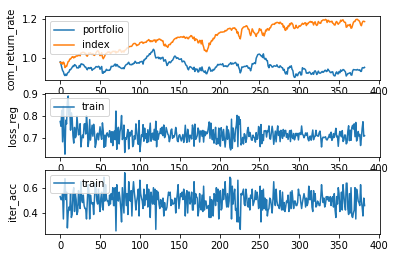

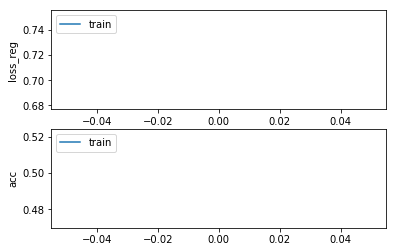

Epochs :  0 Iterations :  383 Loss :  0.7162802091777791 ACC :  0.4970972347352897 MCC :  0.00108071650602118 Precision :  0.5115157078474993
mode : validation


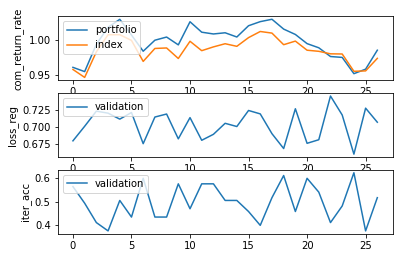

Epochs :  0 Iterations :  27 Loss :  0.7028723381183766 ACC :  0.4989106908992485 MCC :  nan Precision :  0.48241794150736594


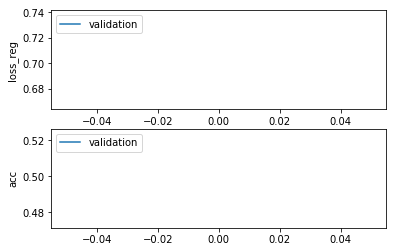

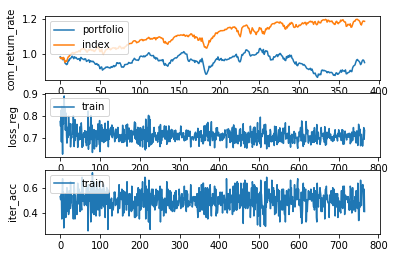

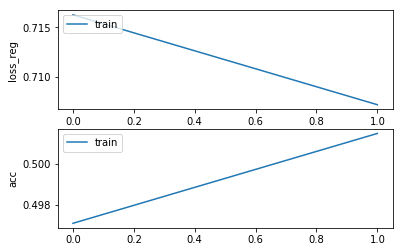

Epochs :  1 Iterations :  766 Loss :  0.7071491640168133 ACC :  0.5014590843539325 MCC :  0.007990744680727956 Precision :  0.5153510295360425
mode : validation


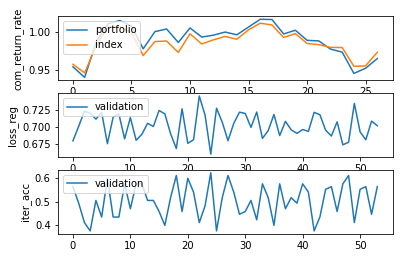

Epochs :  1 Iterations :  27 Loss :  0.700450270264237 ACC :  0.5102396684664267 MCC :  nan Precision :  0.4923919991210655


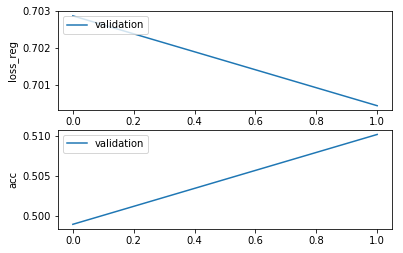

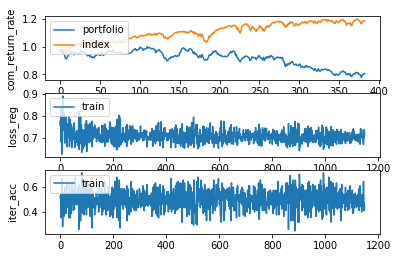

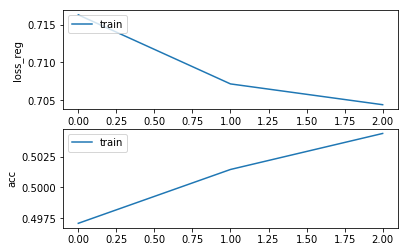

Epochs :  2 Iterations :  1149 Loss :  0.7043993852779697 ACC :  0.5043772239208844 MCC :  0.013362322730928971 Precision :  0.5158492079583379
mode : validation


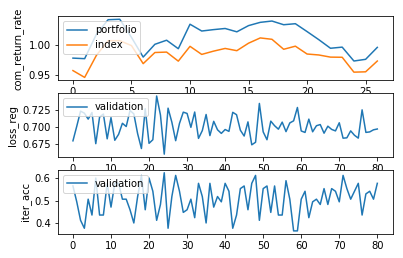

Epochs :  2 Iterations :  27 Loss :  0.6984693540467156 ACC :  0.5054466415334631 MCC :  nan Precision :  0.48985864753248515


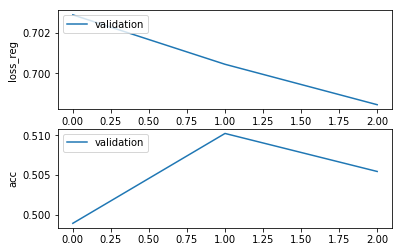

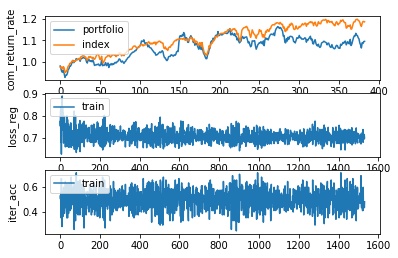

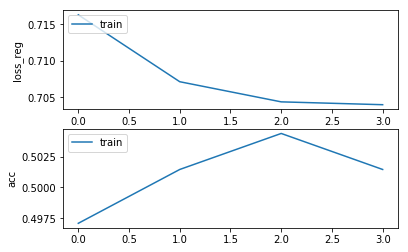

Epochs :  3 Iterations :  1532 Loss :  0.7040108540350712 ACC :  0.5014590845095582 MCC :  0.0029371984662578073 Precision :  0.5121516399960916
mode : validation


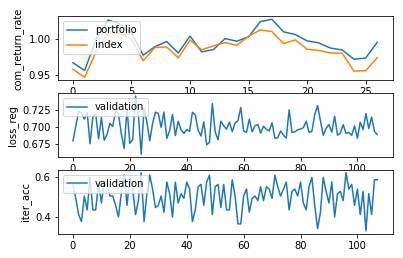

Epochs :  3 Iterations :  27 Loss :  0.7000460227330526 ACC :  0.49978215164608425 MCC :  nan Precision :  0.48968414320713943


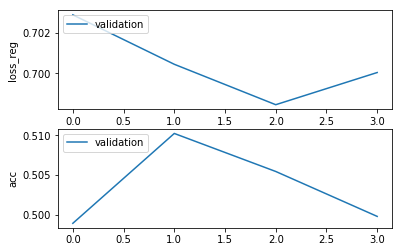

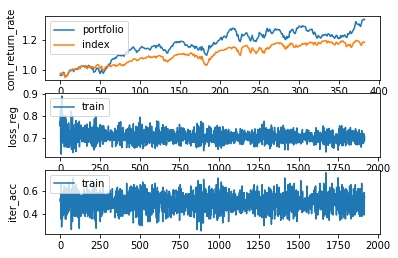

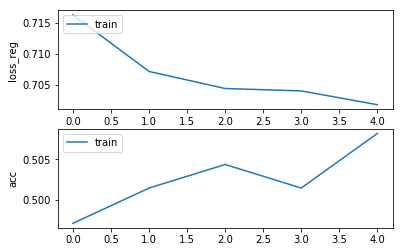

Epochs :  4 Iterations :  1915 Loss :  0.7017847987441419 ACC :  0.5082168798533806 MCC :  0.011735299282388728 Precision :  0.5160096112891603
mode : validation


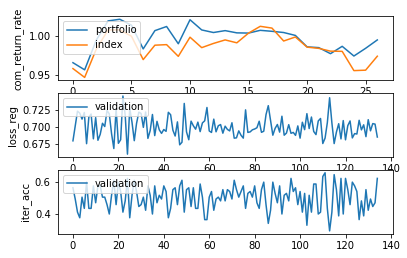

Epochs :  4 Iterations :  27 Loss :  0.69806777327149 ACC :  0.49847495887014603 MCC :  nan Precision :  0.49331390692128074


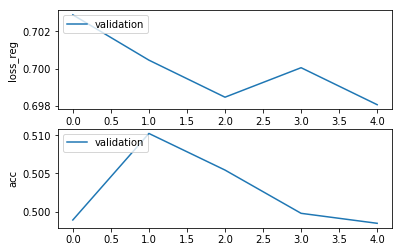

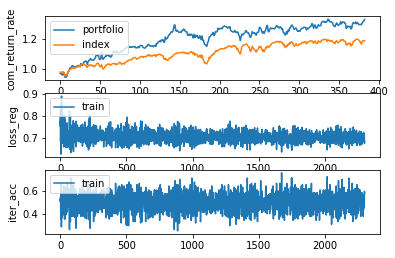

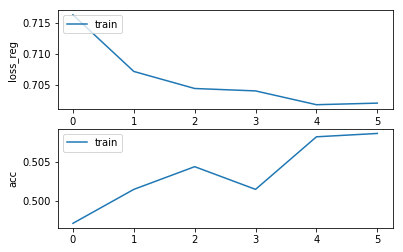

Epochs :  5 Iterations :  2298 Loss :  0.7020383614161618 ACC :  0.508646921607284 MCC :  0.017073191793096878 Precision :  0.5181747987944214
mode : validation


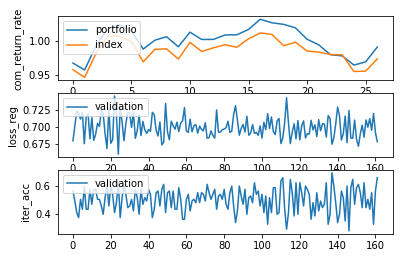

Epochs :  5 Iterations :  27 Loss :  0.6977578070428636 ACC :  0.5032679902182685 MCC :  nan Precision :  0.49651068918131014


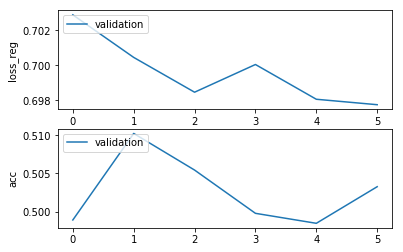

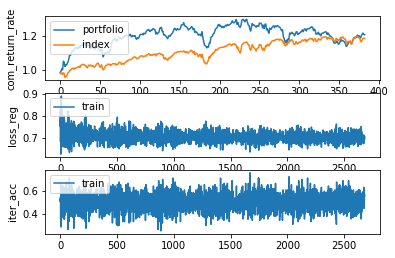

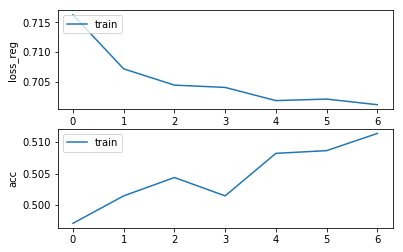

Epochs :  6 Iterations :  2681 Loss :  0.701088638747641 ACC :  0.5113807562592758 MCC :  0.01832186030108462 Precision :  0.5178461031253905
mode : validation


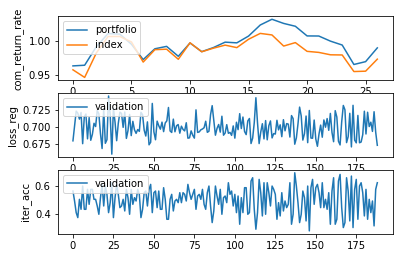

Epochs :  6 Iterations :  27 Loss :  0.6992219863114534 ACC :  0.49193901375488 MCC :  nan Precision :  0.4887147719661395


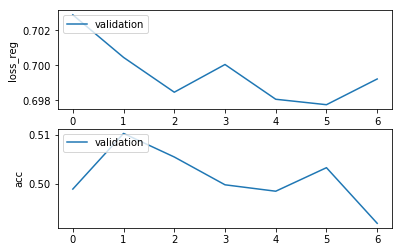

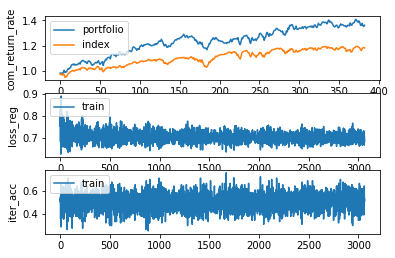

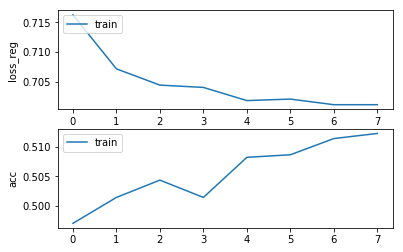

Epochs :  7 Iterations :  3064 Loss :  0.7010896735029495 ACC :  0.5122408391445797 MCC :  0.023021178899239263 Precision :  0.5207183090216109
mode : validation


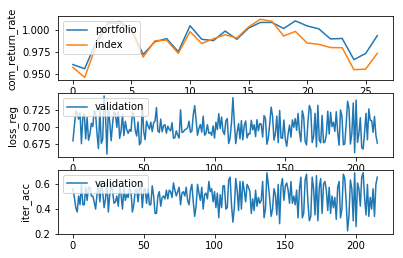

Epochs :  7 Iterations :  27 Loss :  0.6995172610989323 ACC :  0.49455339102833357 MCC :  nan Precision :  0.48954698546893066


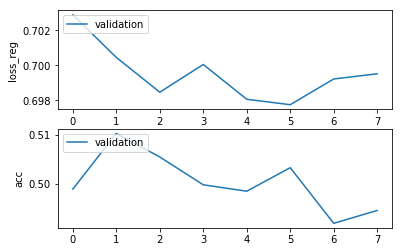

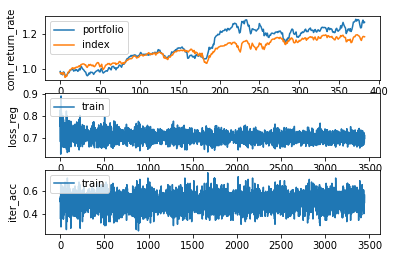

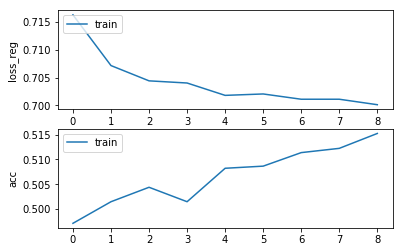

Epochs :  8 Iterations :  3447 Loss :  0.7001049180877427 ACC :  0.5152511293987693 MCC :  0.026266534919741104 Precision :  0.5205804023346997
mode : validation


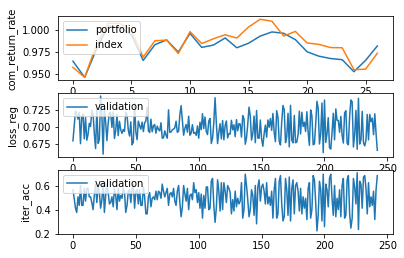

Epochs :  8 Iterations :  27 Loss :  0.699561063890104 ACC :  0.5054466382220939 MCC :  nan Precision :  0.4971783467464977


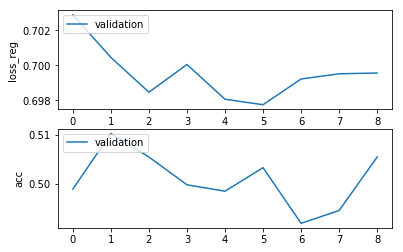

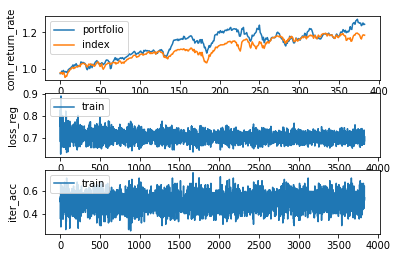

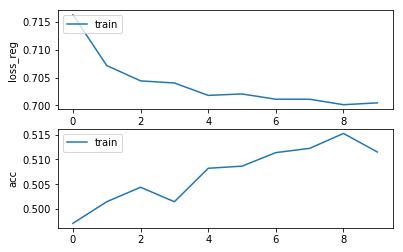

Epochs :  9 Iterations :  3830 Loss :  0.7004342560046024 ACC :  0.5115036251650777 MCC :  0.01903784141207707 Precision :  0.5186129522804103
mode : validation


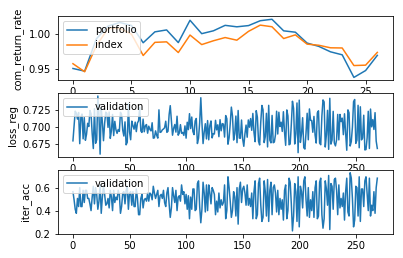

Epochs :  9 Iterations :  27 Loss :  0.6982015172640482 ACC :  0.5119825866487291 MCC :  nan Precision :  0.4987272360810527


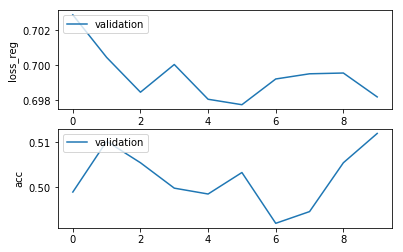

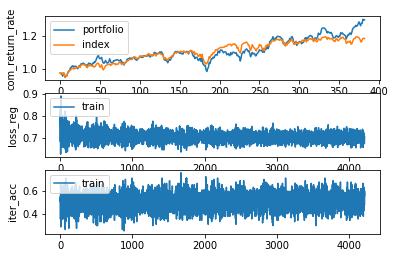

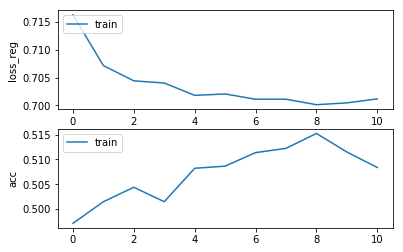

Epochs :  10 Iterations :  4213 Loss :  0.7011544572155407 ACC :  0.5083704657716477 MCC :  0.01894809079220319 Precision :  0.5186800651018831
mode : validation


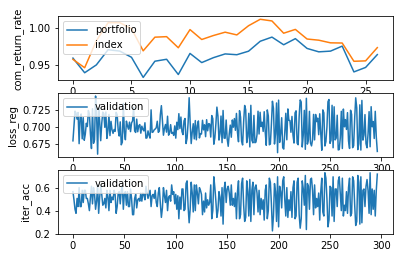

Epochs :  10 Iterations :  27 Loss :  0.6983264110706471 ACC :  0.5141612357563443 MCC :  nan Precision :  0.5051104304967103


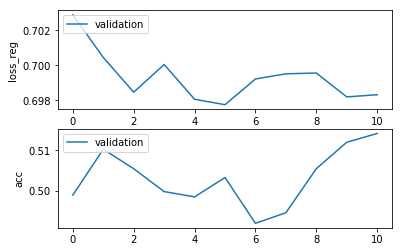

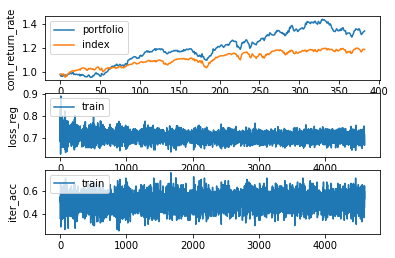

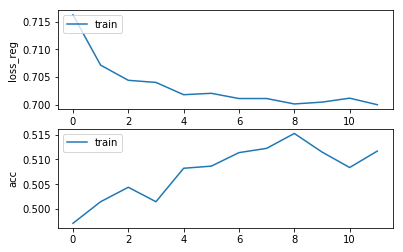

Epochs :  11 Iterations :  4596 Loss :  0.6999687291000904 ACC :  0.5116879290295643 MCC :  0.019875733333204536 Precision :  0.5195969237992175
mode : validation


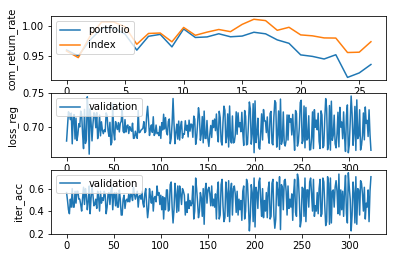

Epochs :  11 Iterations :  27 Loss :  0.7000266666765567 ACC :  0.49891069145114336 MCC :  nan Precision :  0.4928069081571367


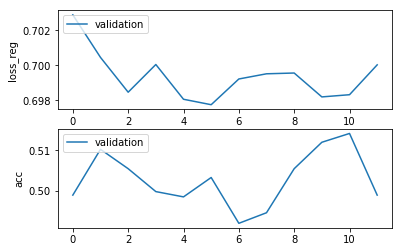

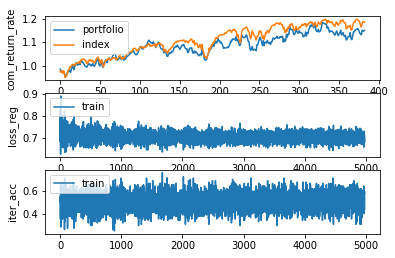

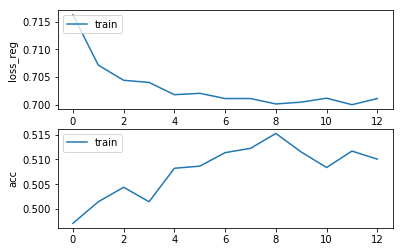

Epochs :  12 Iterations :  4979 Loss :  0.7010888717193205 ACC :  0.5100599149188547 MCC :  0.018049474365464547 Precision :  0.5184301982534072
mode : validation


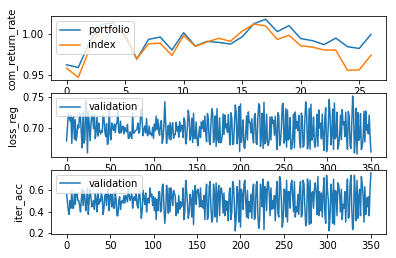

Epochs :  12 Iterations :  27 Loss :  0.6977512152106674 ACC :  0.5102396668107422 MCC :  nan Precision :  0.49684111801562486


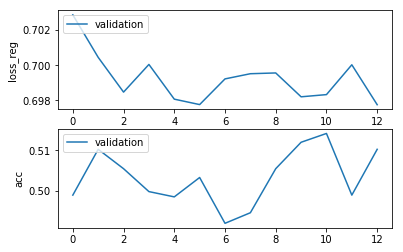

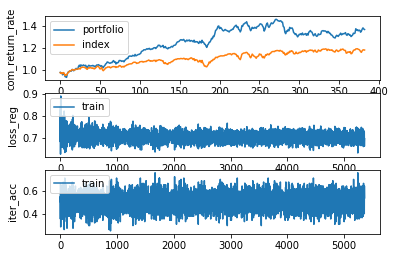

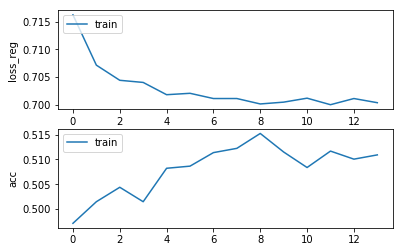

Epochs :  13 Iterations :  5362 Loss :  0.7003324293281017 ACC :  0.5109199976485329 MCC :  0.01810933183027582 Precision :  0.5186010365795062
mode : validation


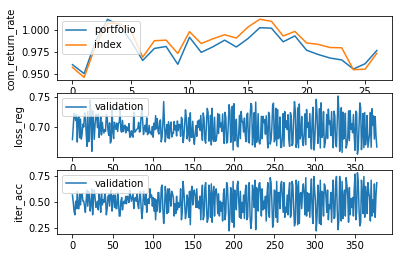

Epochs :  13 Iterations :  27 Loss :  0.696879506111145 ACC :  0.5167756146854825 MCC :  nan Precision :  0.5007175114695672


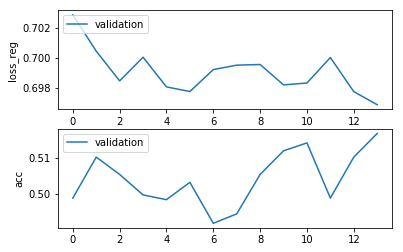

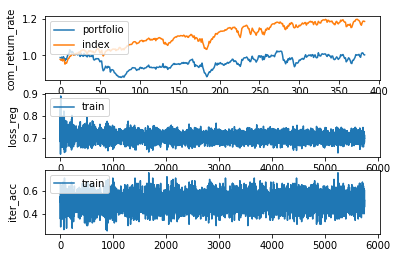

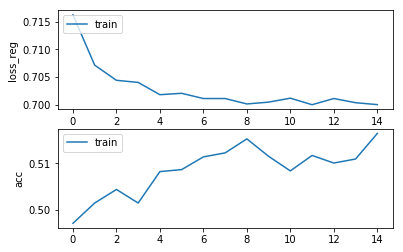

Epochs :  14 Iterations :  5745 Loss :  0.6999835468459067 ACC :  0.5164183855212389 MCC :  0.02957566801820913 Precision :  0.5226538277646969
mode : validation


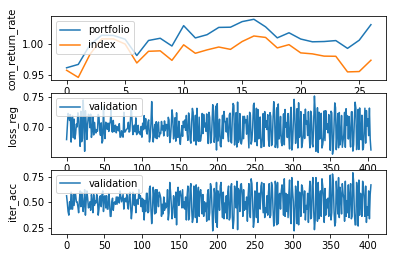

Epochs :  14 Iterations :  27 Loss :  0.6984382117236102 ACC :  0.5041394487575248 MCC :  nan Precision :  0.4925209177588975


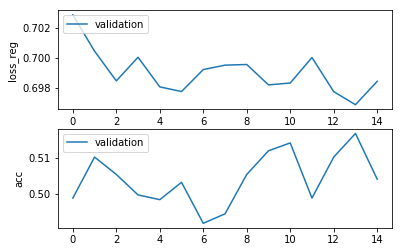

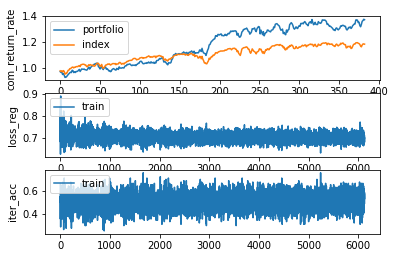

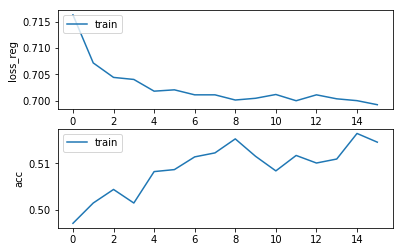

Epochs :  15 Iterations :  6128 Loss :  0.699214382208981 ACC :  0.5145446328986095 MCC :  0.03283873724346304 Precision :  0.5235131581267707
mode : validation


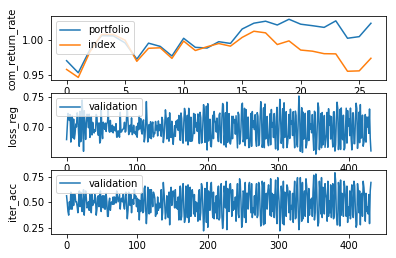

Epochs :  15 Iterations :  27 Loss :  0.6989088367532801 ACC :  0.49586058214858725 MCC :  nan Precision :  0.49024571892287994


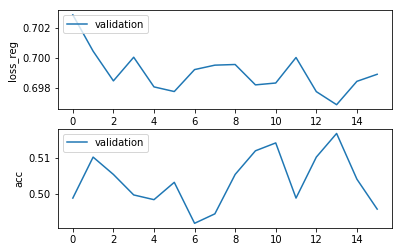

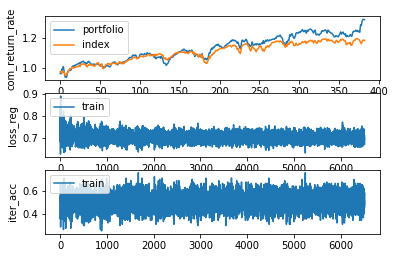

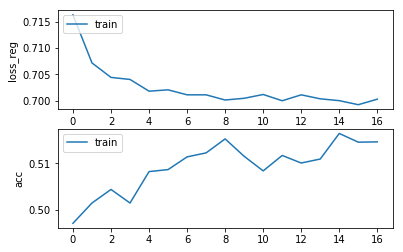

Epochs :  16 Iterations :  6511 Loss :  0.7002646348806336 ACC :  0.5146060668457271 MCC :  0.01847672590429046 Precision :  0.5187456897622845
mode : validation


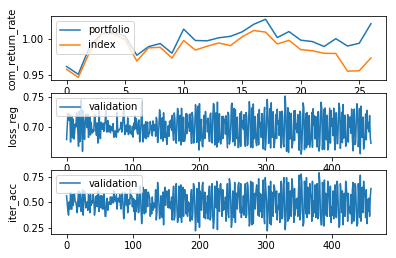

Epochs :  16 Iterations :  27 Loss :  0.6988694888574106 ACC :  0.49673204289542305 MCC :  nan Precision :  0.48949010808158805


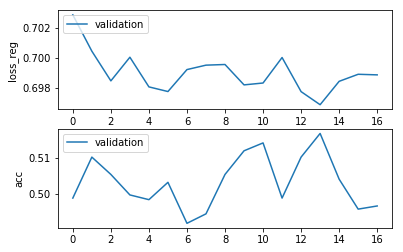

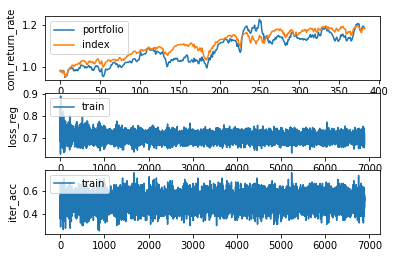

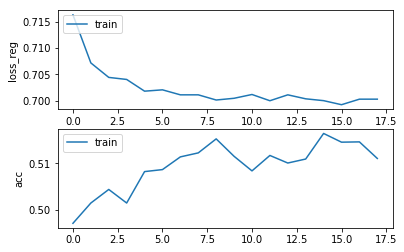

Epochs :  17 Iterations :  6894 Loss :  0.7002667527908445 ACC :  0.5110428672546506 MCC :  0.02212997127595472 Precision :  0.5196212982909642
mode : validation


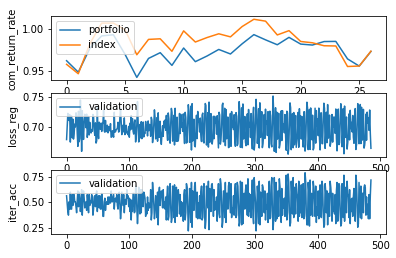

Epochs :  17 Iterations :  27 Loss :  0.7000028181959081 ACC :  0.50631809786514 MCC :  nan Precision :  0.4900490349089658


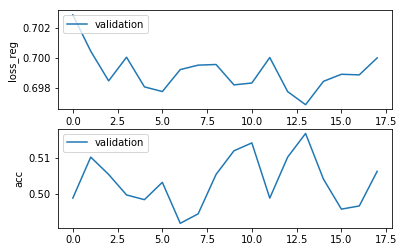

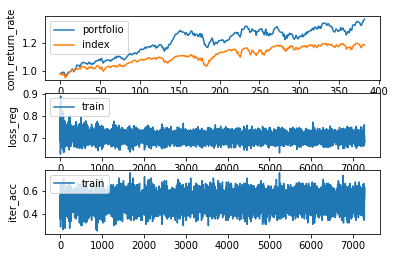

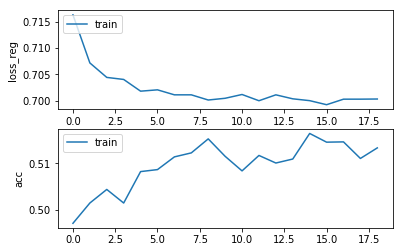

Epochs :  18 Iterations :  7277 Loss :  0.7002948247110252 ACC :  0.5133159429068354 MCC :  0.028036040879479626 Precision :  0.5229003411564519
mode : validation


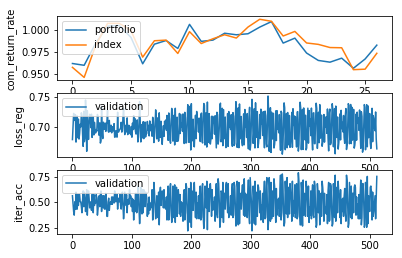

Epochs :  18 Iterations :  27 Loss :  0.6979924241701762 ACC :  0.49847496218151516 MCC :  nan Precision :  0.49074981209856494


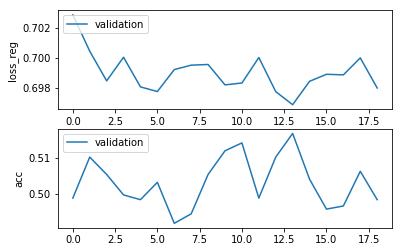

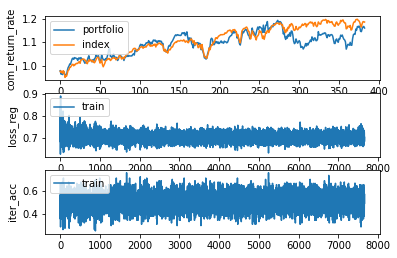

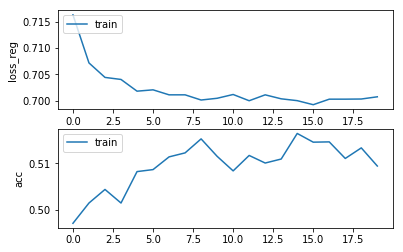

Epochs :  19 Iterations :  7660 Loss :  0.7007151369015169 ACC :  0.509414853143941 MCC :  0.023173960944632793 Precision :  0.5202102408727374
mode : validation


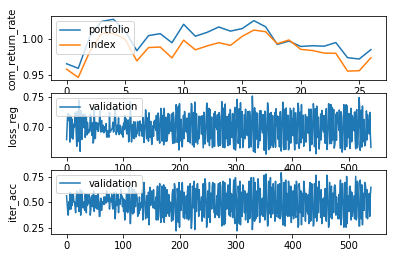

Epochs :  19 Iterations :  27 Loss :  0.6989457717648259 ACC :  0.506753827686663 MCC :  nan Precision :  0.49615140893944987


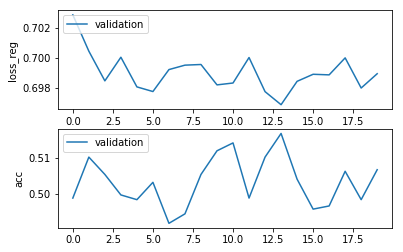

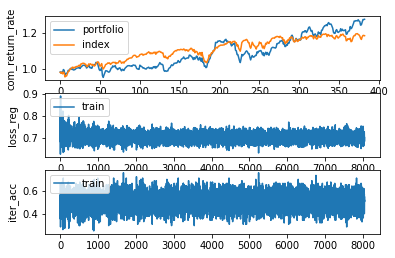

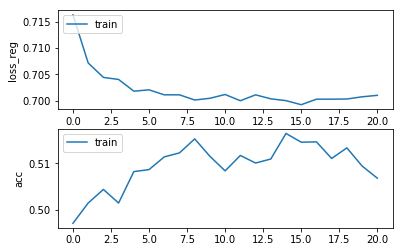

Epochs :  20 Iterations :  8043 Loss :  0.7009923078372646 ACC :  0.5068038861527455 MCC :  0.019614648865566253 Precision :  0.5186673965130011
mode : validation


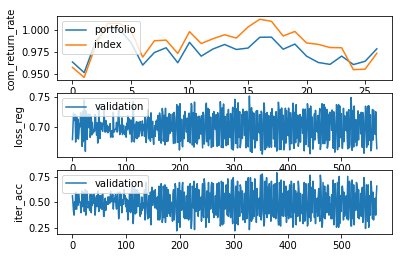

Epochs :  20 Iterations :  27 Loss :  0.6978517572085062 ACC :  0.4980392318080973 MCC :  nan Precision :  0.4926386932256045


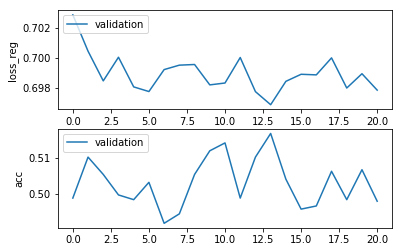

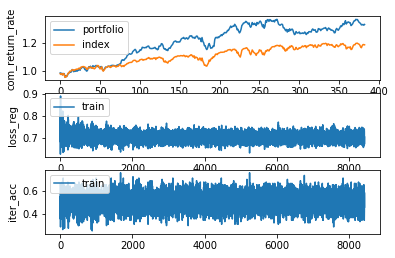

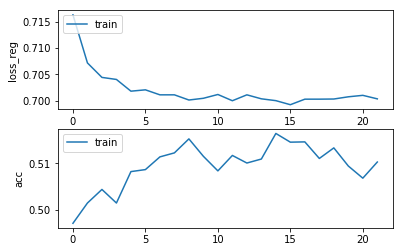

Epochs :  21 Iterations :  8426 Loss :  0.7003256649012354 ACC :  0.5102749356401807 MCC :  0.020524663785314454 Precision :  0.5201040158977163
mode : validation


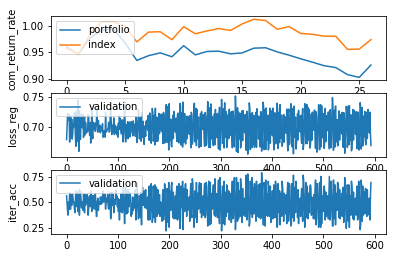

Epochs :  21 Iterations :  27 Loss :  0.698972640214143 ACC :  0.49978214999039966 MCC :  nan Precision :  0.49413218597571057


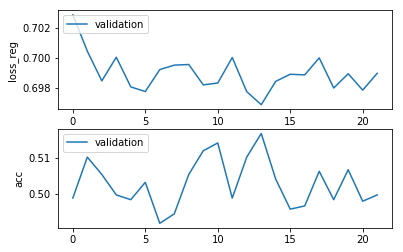

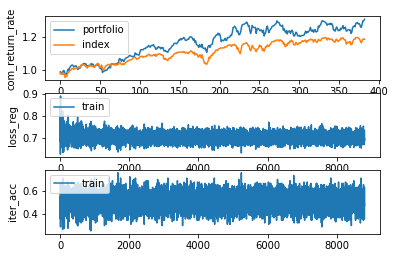

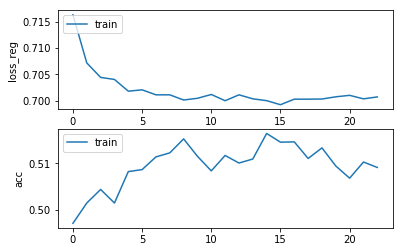

Epochs :  22 Iterations :  8809 Loss :  0.7006927582364793 ACC :  0.5091076795177111 MCC :  0.015406300123949966 Precision :  0.5174958253468998
mode : validation


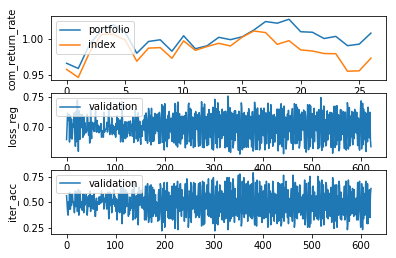

Epochs :  22 Iterations :  27 Loss :  0.6981993273452476 ACC :  0.4945533921321233 MCC :  nan Precision :  0.49463276992793437


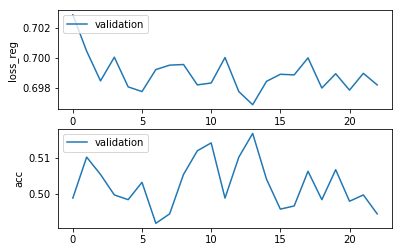

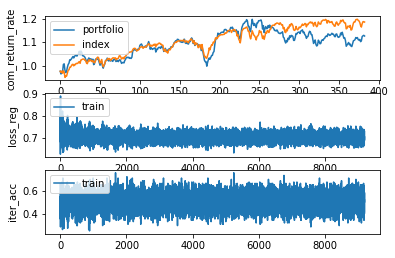

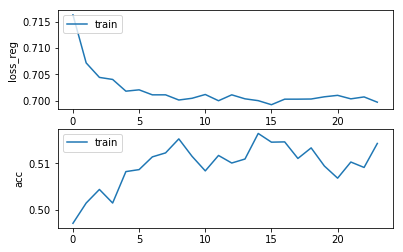

Epochs :  23 Iterations :  9192 Loss :  0.699693454152299 ACC :  0.5142681779189148 MCC :  0.03198674838934045 Precision :  0.5236549715149185
mode : validation


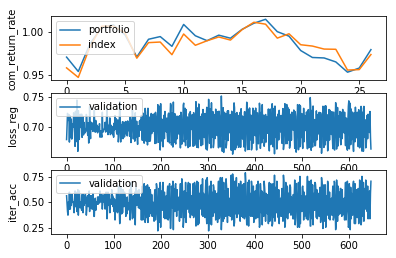

Epochs :  23 Iterations :  27 Loss :  0.6970754442391572 ACC :  0.5150326942956006 MCC :  nan Precision :  0.4967743804057439


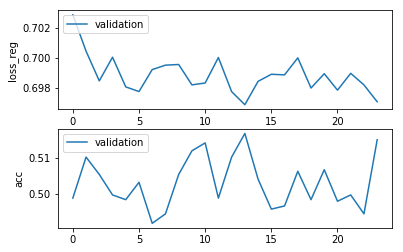

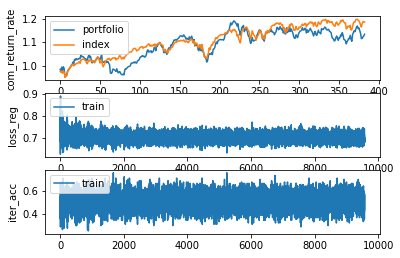

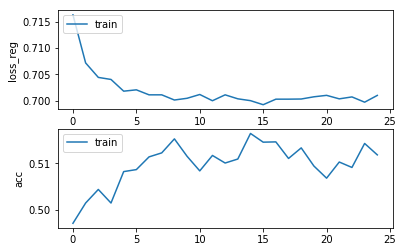

Epochs :  24 Iterations :  9575 Loss :  0.7009806427569676 ACC :  0.5118107978575535 MCC :  0.020331696261574002 Precision :  0.5191163678043194
mode : validation


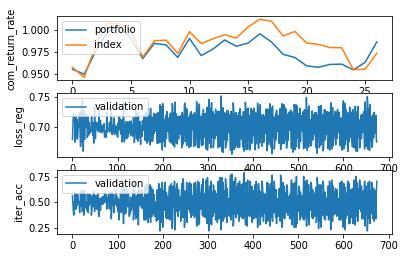

Epochs :  24 Iterations :  27 Loss :  0.6993117575292234 ACC :  0.503703718384107 MCC :  nan Precision :  0.49730911699158176


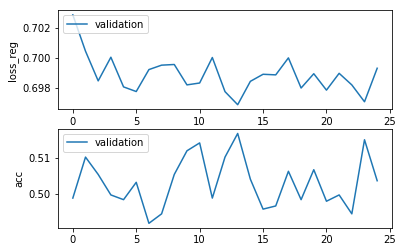

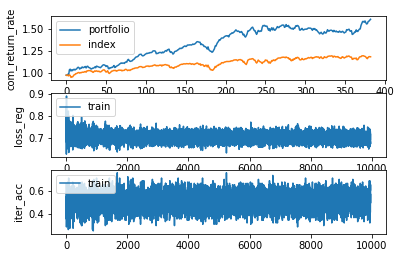

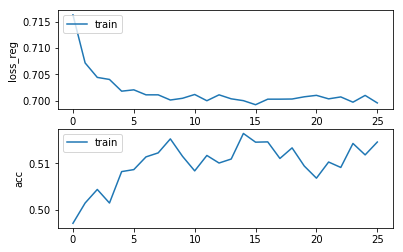

Epochs :  25 Iterations :  9958 Loss :  0.6995514071018827 ACC :  0.5145753504557647 MCC :  0.025155719989417097 Precision :  0.520864923837213
mode : validation


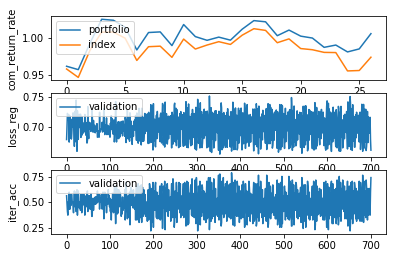

Epochs :  25 Iterations :  27 Loss :  0.6968924955085471 ACC :  0.5189542626893079 MCC :  nan Precision :  0.4980096616954715


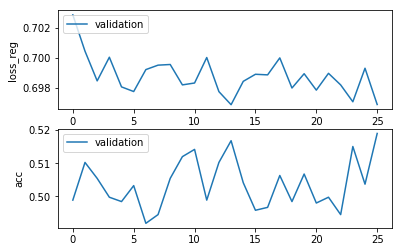

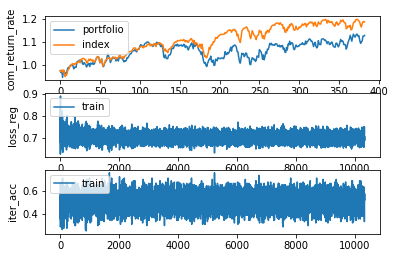

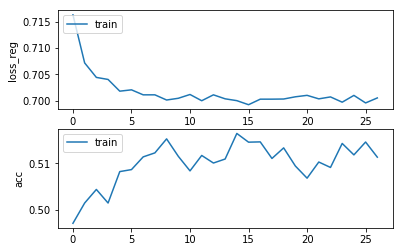

Epochs :  26 Iterations :  10341 Loss :  0.7005006106030537 ACC :  0.5113193222343455 MCC :  0.02475348760753228 Precision :  0.520806547784424
mode : validation


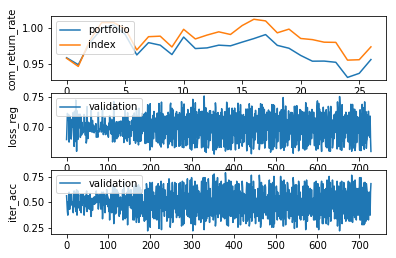

Epochs :  26 Iterations :  27 Loss :  0.6979147703559311 ACC :  0.505010908400571 MCC :  nan Precision :  0.49925184629305647


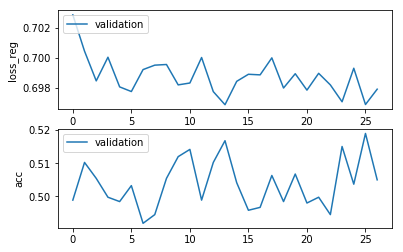

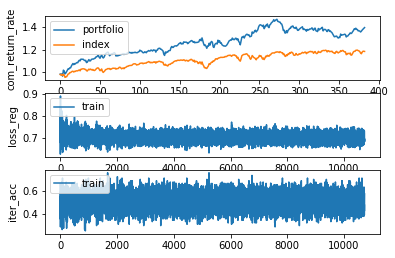

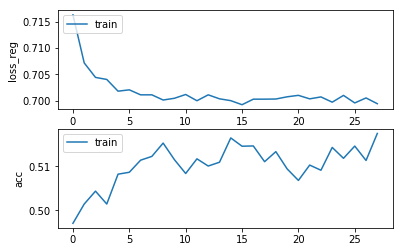

Epochs :  27 Iterations :  10724 Loss :  0.6994035004324453 ACC :  0.5174320544804356 MCC :  0.032005048704068555 Precision :  0.5230813175780266
mode : validation


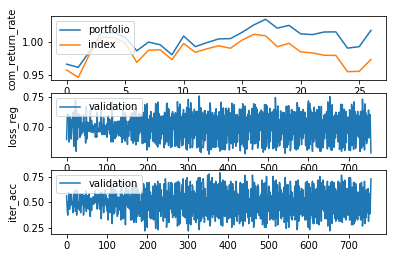

Epochs :  27 Iterations :  27 Loss :  0.6984691752327813 ACC :  0.5028322603967454 MCC :  nan Precision :  0.4946282889556002


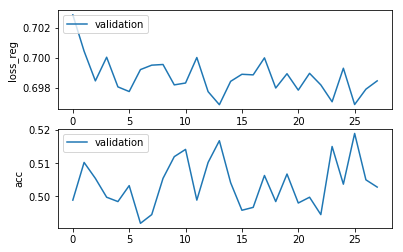

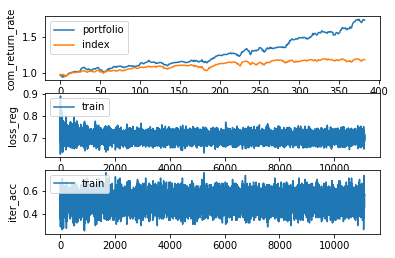

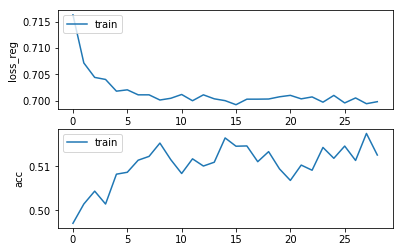

Epochs :  28 Iterations :  11107 Loss :  0.6997880126415282 ACC :  0.5125480120704939 MCC :  0.019900943942285355 Precision :  0.519358160849612
mode : validation


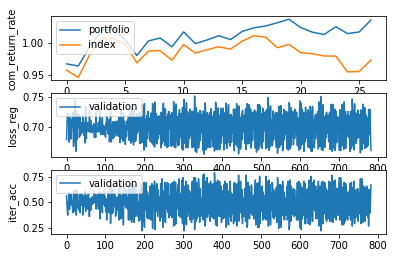

Epochs :  28 Iterations :  27 Loss :  0.698202442239832 ACC :  0.5010893411106534 MCC :  nan Precision :  0.4940273207094934


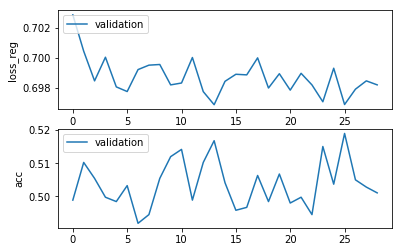

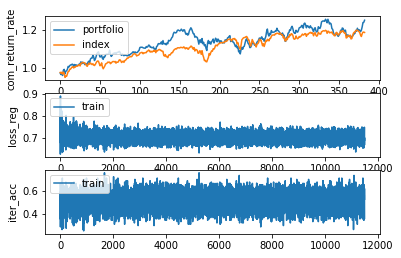

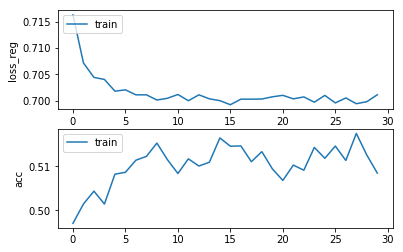

Epochs :  29 Iterations :  11490 Loss :  0.7011047584581002 ACC :  0.5084626175871717 MCC :  0.016926673445522337 Precision :  0.5177111614534422
mode : validation


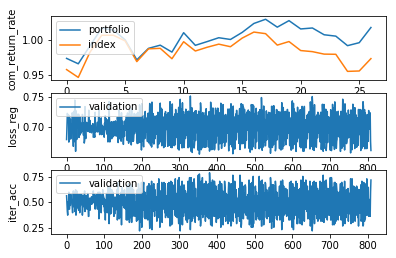

Epochs :  29 Iterations :  27 Loss :  0.6976862616009183 ACC :  0.5093682077195909 MCC :  nan Precision :  0.4996042924898642


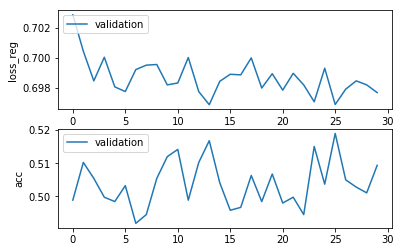

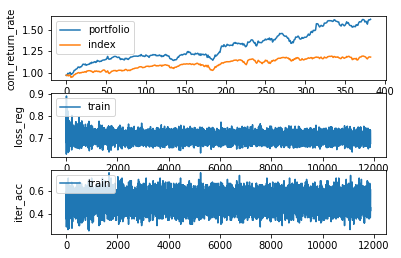

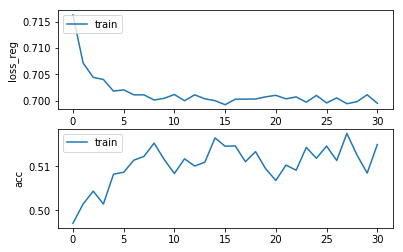

Epochs :  30 Iterations :  11873 Loss :  0.6994889439241693 ACC :  0.5149132401607055 MCC :  0.028160758522143416 Precision :  0.5224497976272754
mode : validation


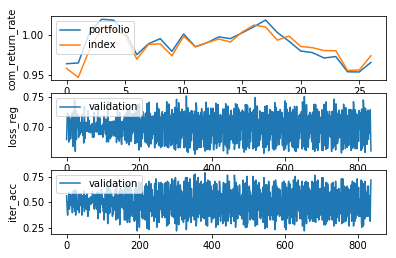

Epochs :  30 Iterations :  27 Loss :  0.7000707034711484 ACC :  0.5002178803638175 MCC :  nan Precision :  0.4944305390947395


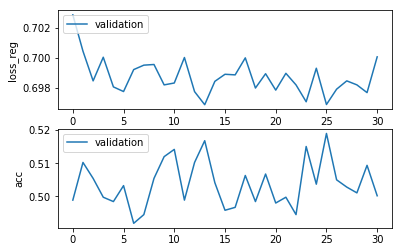

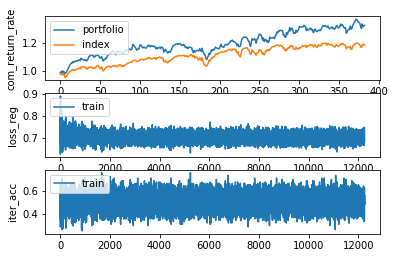

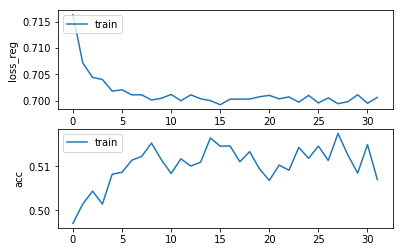

Epochs :  31 Iterations :  12256 Loss :  0.700600855499895 ACC :  0.5070189073409487 MCC :  0.015710532179378293 Precision :  0.5174355624199848
mode : validation


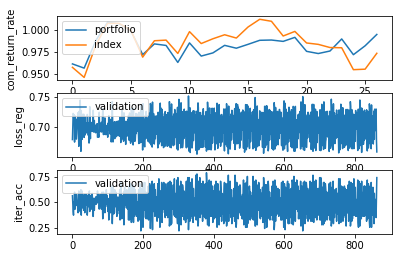

Epochs :  31 Iterations :  27 Loss :  0.6987450851334466 ACC :  0.48714598682191634 MCC :  nan Precision :  0.49007662578865335


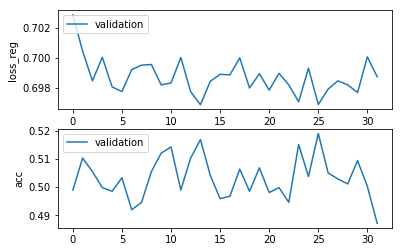

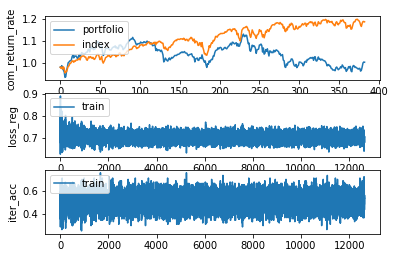

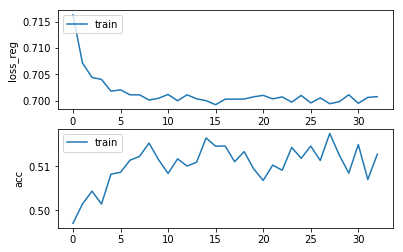

Epochs :  32 Iterations :  12639 Loss :  0.7007438148281904 ACC :  0.5127323154681034 MCC :  0.022085109148381216 Precision :  0.5199436239859299
mode : validation


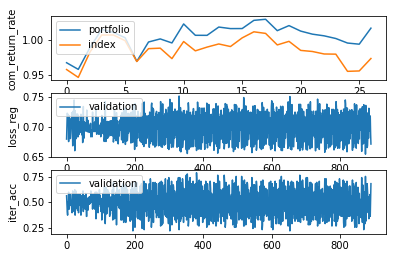

Epochs :  32 Iterations :  27 Loss :  0.6990358608740347 ACC :  0.49411766451817973 MCC :  nan Precision :  0.48865264460996344


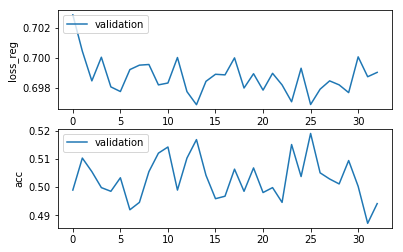

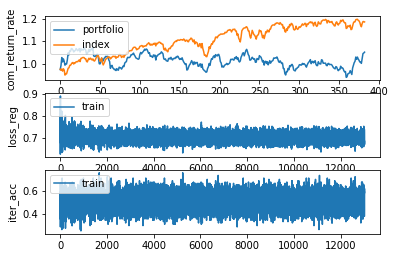

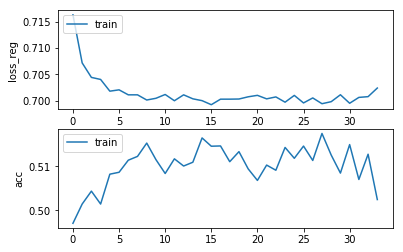

Epochs :  33 Iterations :  13022 Loss :  0.7023801230886275 ACC :  0.5024727530796907 MCC :  0.0035243973639907983 Precision :  0.5128514466967735
mode : validation


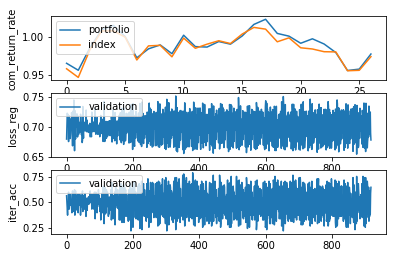

Epochs :  33 Iterations :  27 Loss :  0.7001608897138525 ACC :  0.5054466382220939 MCC :  nan Precision :  0.495784074757938


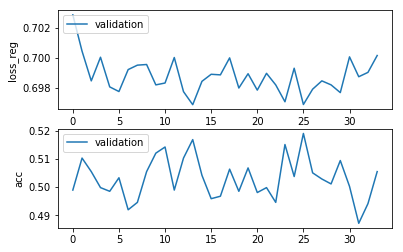

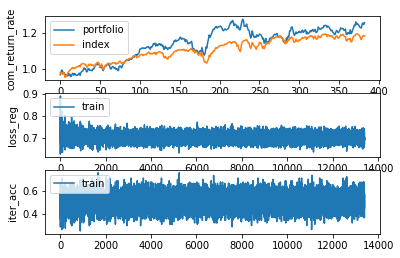

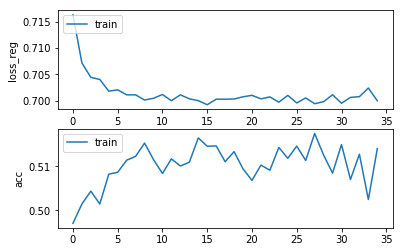

Epochs :  34 Iterations :  13405 Loss :  0.6999589788384599 ACC :  0.513991722861407 MCC :  0.018771376480243848 Precision :  0.518505508595635
mode : validation


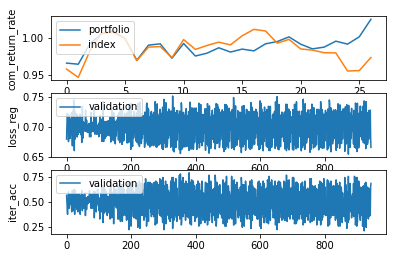

Epochs :  34 Iterations :  27 Loss :  0.700129974771429 ACC :  0.4910675530080442 MCC :  nan Precision :  0.4909176329771678


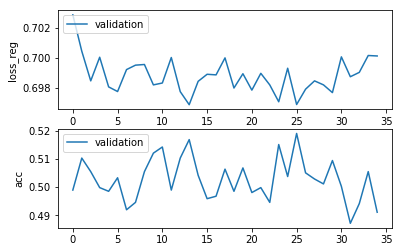

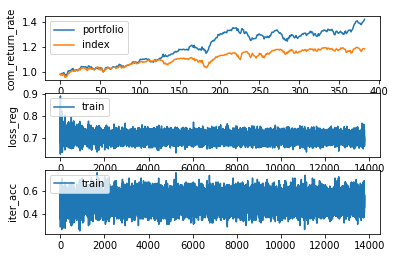

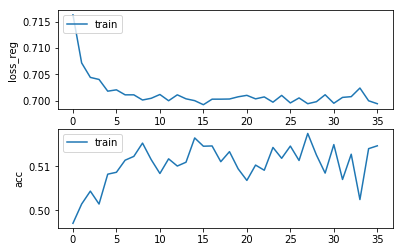

Epochs :  35 Iterations :  13788 Loss :  0.6994025596750623 ACC :  0.5146367851810106 MCC :  0.022179128843792483 Precision :  0.5197095356580094
mode : validation


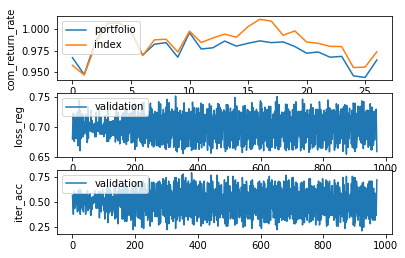

Epochs :  35 Iterations :  27 Loss :  0.6997762896396496 ACC :  0.49455339268401816 MCC :  nan Precision :  0.4881796958269896


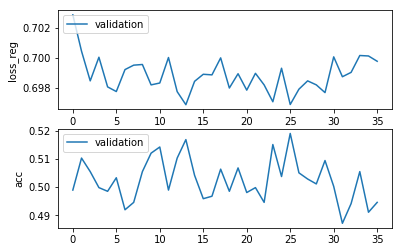

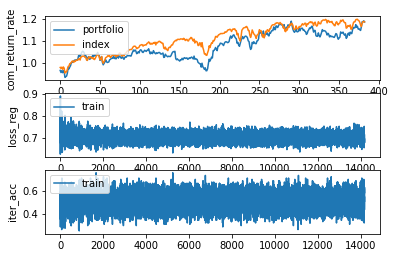

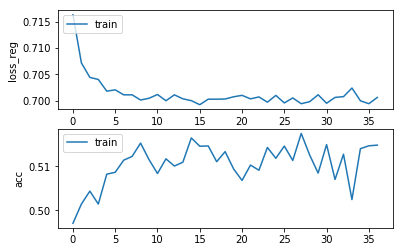

Epochs :  36 Iterations :  14171 Loss :  0.700597560592482 ACC :  0.5147903719552192 MCC :  0.02674218280758835 Precision :  0.5215932138448984
mode : validation


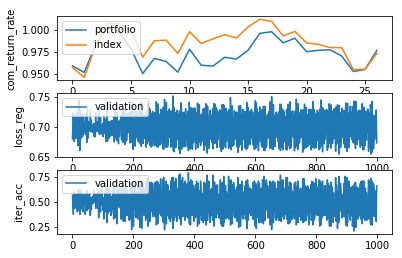

Epochs :  36 Iterations :  27 Loss :  0.6984818710221185 ACC :  0.4949891225055412 MCC :  nan Precision :  0.4881589655522947


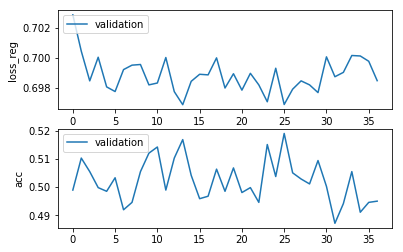

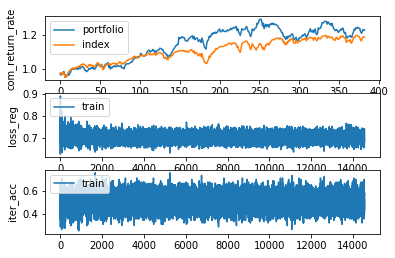

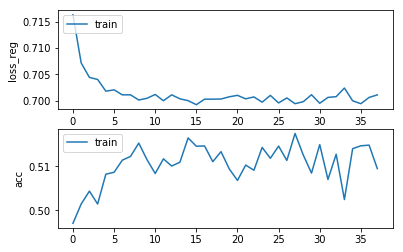

Epochs :  37 Iterations :  14554 Loss :  0.7010762456502989 ACC :  0.5094762874801227 MCC :  0.019379987553893967 Precision :  0.5201096781979342
mode : validation


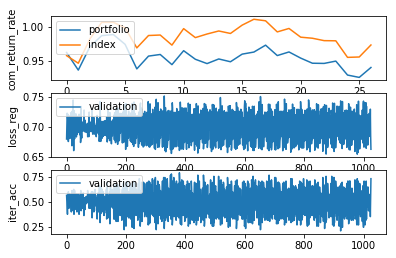

Epochs :  37 Iterations :  27 Loss :  0.7007920499201175 ACC :  0.49847496052583057 MCC :  nan Precision :  0.49013596814539695


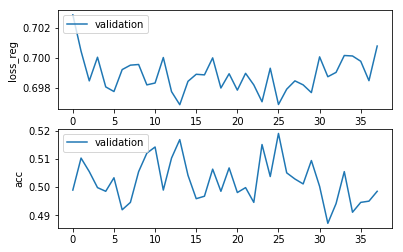

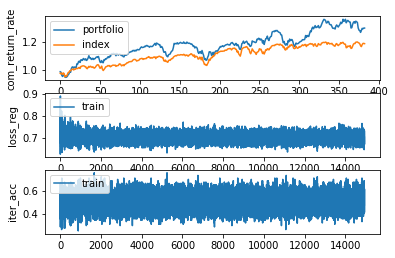

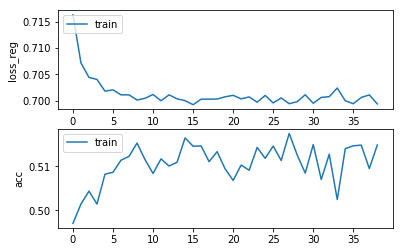

Epochs :  38 Iterations :  14937 Loss :  0.6993641093879083 ACC :  0.5148210882673687 MCC :  0.02438363966570958 Precision :  0.521158424038294
mode : validation


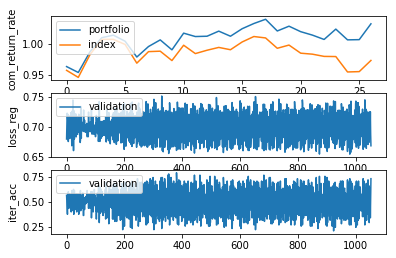

Epochs :  38 Iterations :  27 Loss :  0.6981131412364818 ACC :  0.5111111270056831 MCC :  nan Precision :  0.49653888314410494


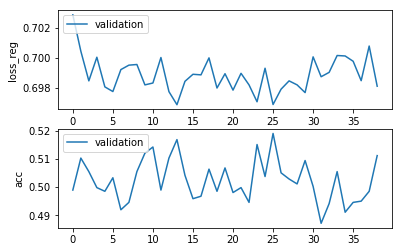

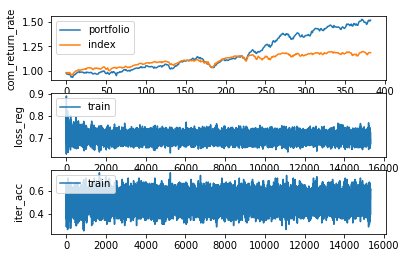

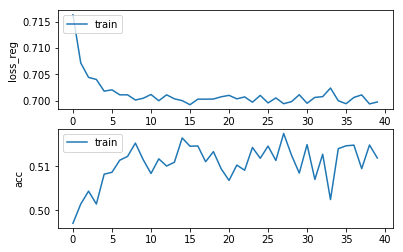

Epochs :  39 Iterations :  15320 Loss :  0.6997282467685232 ACC :  0.5118722328162381 MCC :  0.026863341128536288 Precision :  0.5211120325021504
mode : validation


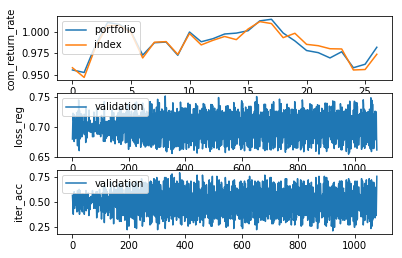

Epochs :  39 Iterations :  27 Loss :  0.6993072121231644 ACC :  0.4958605827004821 MCC :  nan Precision :  0.4911831653228513


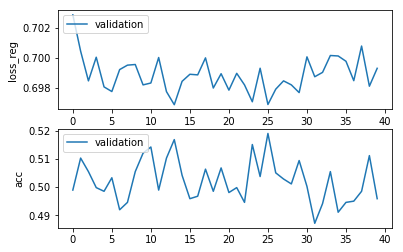

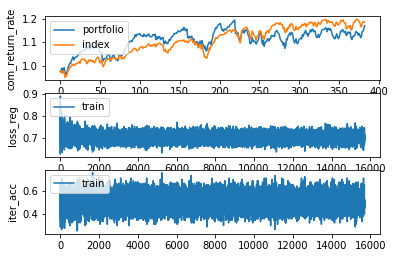

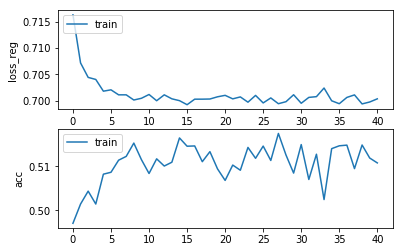

Epochs :  40 Iterations :  15703 Loss :  0.7003299735544867 ACC :  0.5107664114968272 MCC :  0.02027595437216322 Precision :  0.5196693750005945
mode : validation


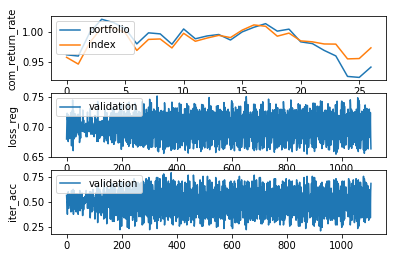

Epochs :  40 Iterations :  27 Loss :  0.6983758564348574 ACC :  0.5010893400068637 MCC :  nan Precision :  0.4892465553625866


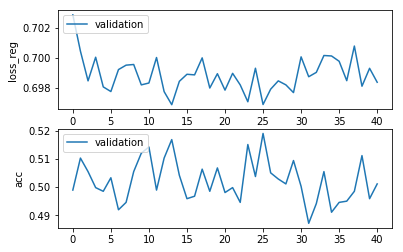

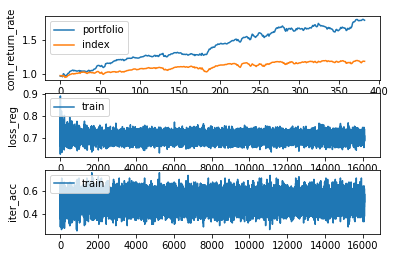

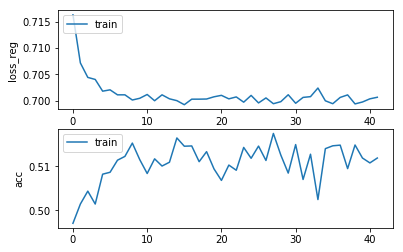

Epochs :  41 Iterations :  16086 Loss :  0.7006282990034816 ACC :  0.5118722318046709 MCC :  0.023383017943675966 Precision :  0.5196032568121781
mode : validation


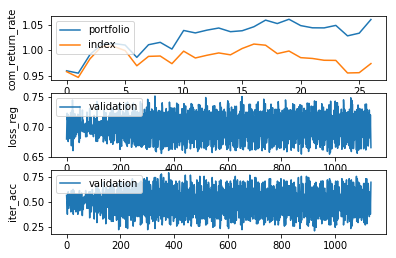

Epochs :  41 Iterations :  27 Loss :  0.6979892231799938 ACC :  0.5002178803638175 MCC :  nan Precision :  0.4935989552349956


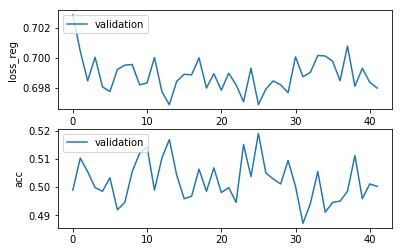

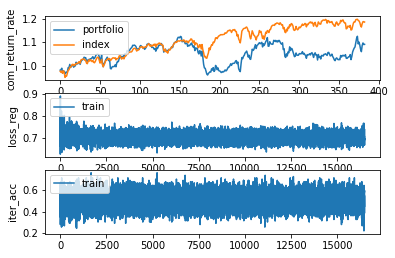

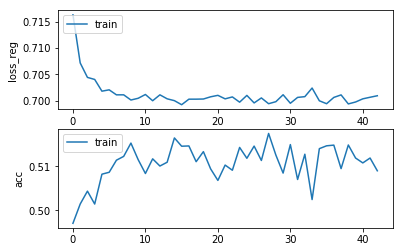

Epochs :  42 Iterations :  16469 Loss :  0.7009157259843991 ACC :  0.5089848107286284 MCC :  0.015998944677850208 Precision :  0.5186944293592601
mode : validation


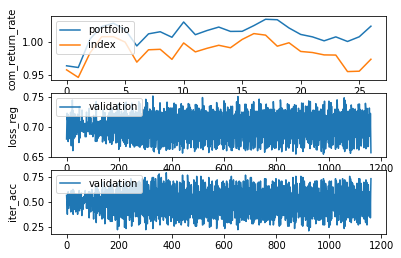

Epochs :  42 Iterations :  27 Loss :  0.698001691588649 ACC :  0.49978215164608425 MCC :  nan Precision :  0.4963932931423187


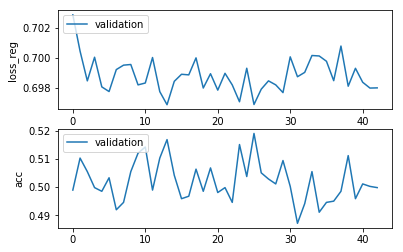

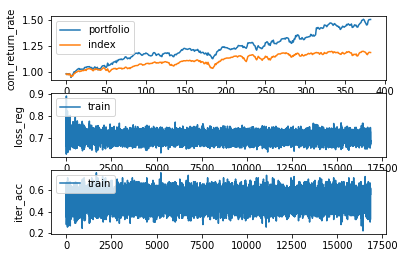

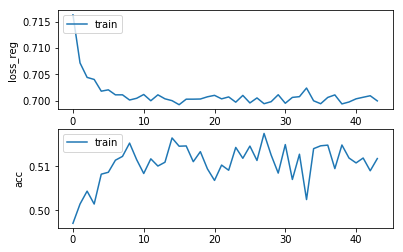

Epochs :  43 Iterations :  16852 Loss :  0.6999365958159026 ACC :  0.5117493635991845 MCC :  0.021729187937313568 Precision :  0.5198777181196073
mode : validation


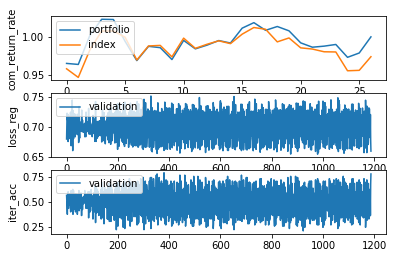

Epochs :  43 Iterations :  27 Loss :  0.6979530564060917 ACC :  0.5102396657069524 MCC :  nan Precision :  0.5018450260438301


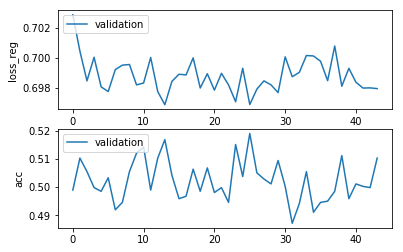

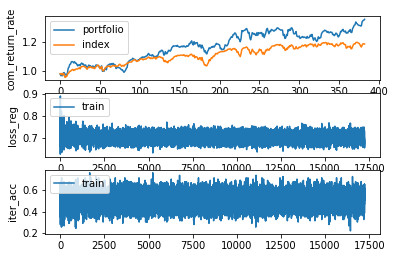

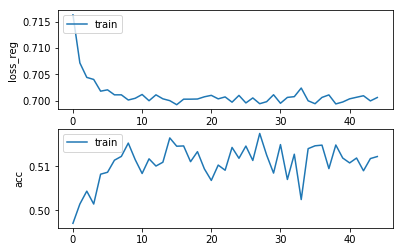

Epochs :  44 Iterations :  17235 Loss :  0.7005822087392484 ACC :  0.5122101222877403 MCC :  0.018019659303501977 Precision :  0.5190780461077669
mode : validation


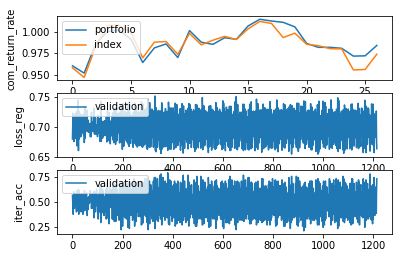

Epochs :  44 Iterations :  27 Loss :  0.6977341086776169 ACC :  0.5128540451879855 MCC :  nan Precision :  0.4970262092710645


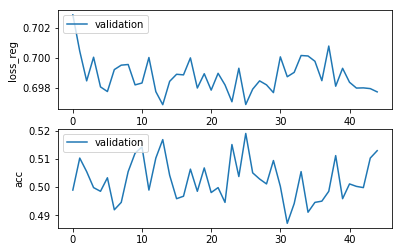

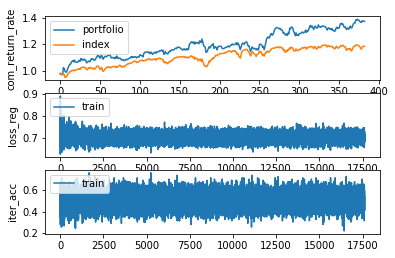

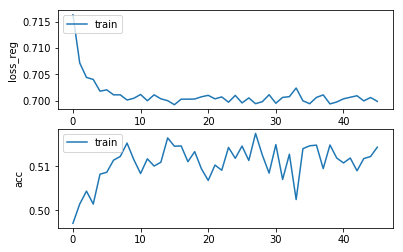

Epochs :  45 Iterations :  17618 Loss :  0.6998534224363282 ACC :  0.5143296126441607 MCC :  0.02708232854420013 Precision :  0.5227383089156982
mode : validation


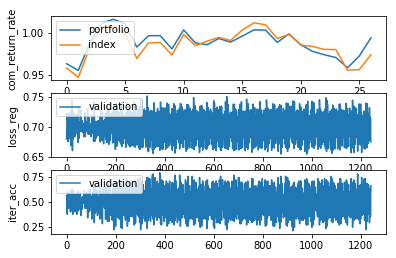

Epochs :  45 Iterations :  27 Loss :  0.6981133200504162 ACC :  0.49891069034735364 MCC :  nan Precision :  0.49247099817902956


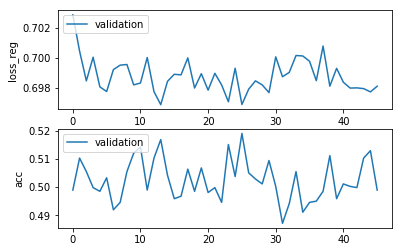

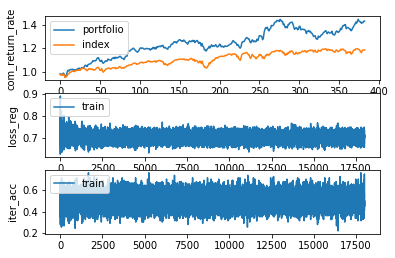

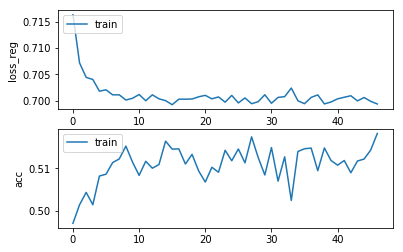

Epochs :  46 Iterations :  18001 Loss :  0.6993525619606437 ACC :  0.5182307031851836 MCC :  0.029059986282971642 Precision :  0.5222218143547017
mode : validation


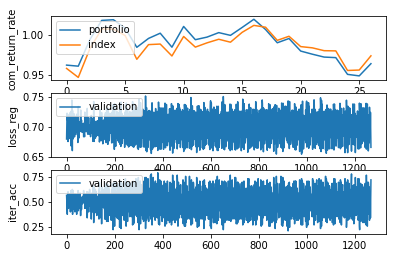

Epochs :  46 Iterations :  27 Loss :  0.6984745043295401 ACC :  0.5080610182550218 MCC :  nan Precision :  0.49850662190605094


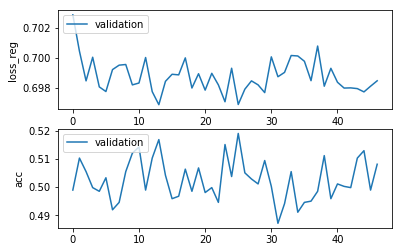

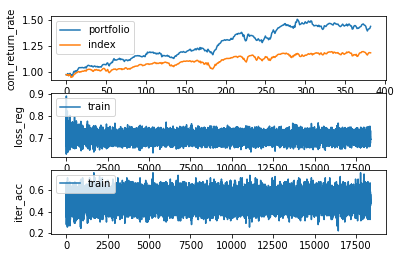

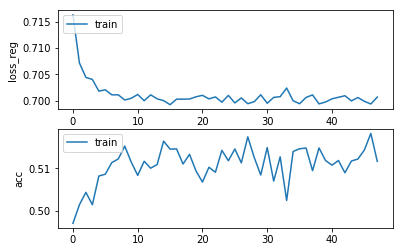

Epochs :  47 Iterations :  18384 Loss :  0.7006693006184331 ACC :  0.5116572123283506 MCC :  0.026753537747741484 Precision :  0.5226506716413691
mode : validation


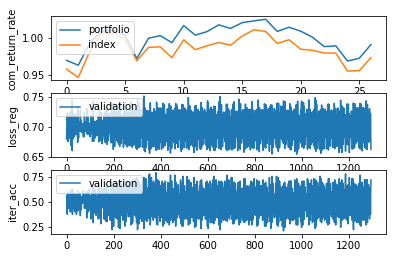

Epochs :  47 Iterations :  27 Loss :  0.6994846772264551 ACC :  0.5032679891144788 MCC :  nan Precision :  0.49449170256654423


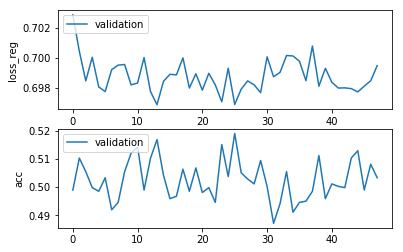

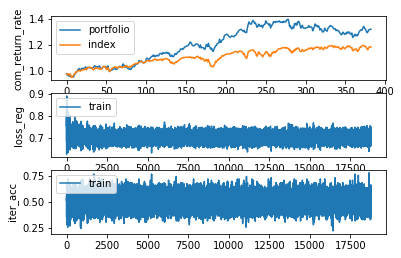

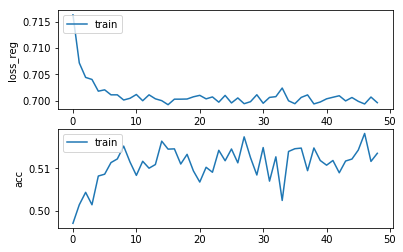

Epochs :  48 Iterations :  18767 Loss :  0.6995987471961477 ACC :  0.5135616812631293 MCC :  0.022386637364949436 Precision :  0.5199539270397888
mode : validation


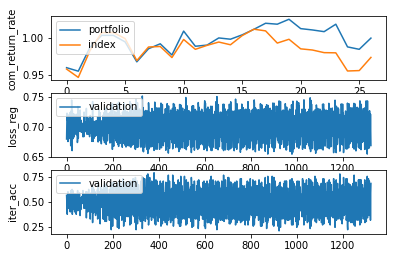

Epochs :  48 Iterations :  27 Loss :  0.6984049236332929 ACC :  0.5141612357563443 MCC :  nan Precision :  0.49803320690989494


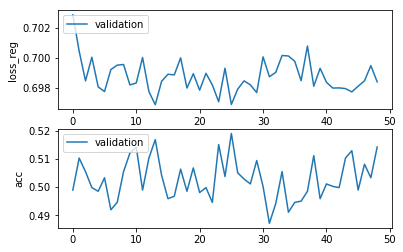

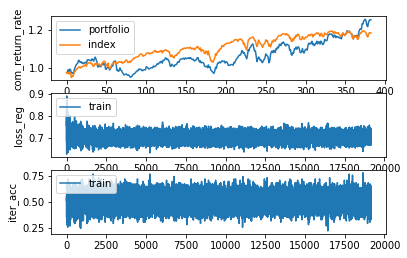

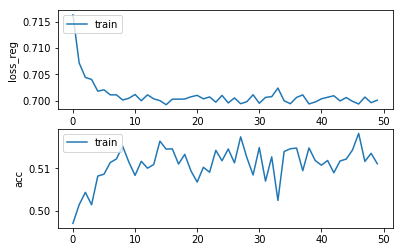

Epochs :  49 Iterations :  19150 Loss :  0.7000746548020186 ACC :  0.5111043016686452 MCC :  0.021305521523978747 Precision :  0.5198479510561682
mode : validation


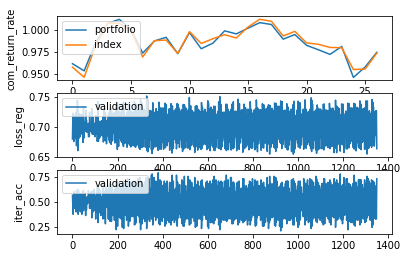

Epochs :  49 Iterations :  27 Loss :  0.6997004526632803 ACC :  0.5023965289195379 MCC :  nan Precision :  0.49138676195784853


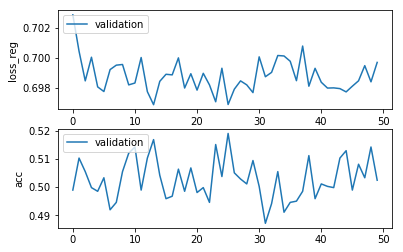

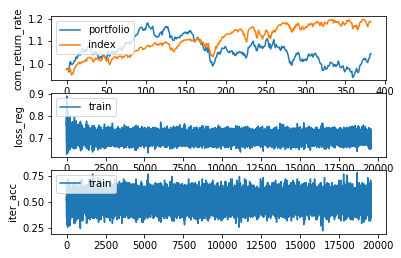

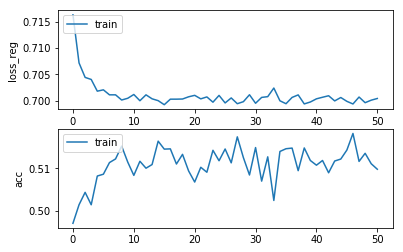

Epochs :  50 Iterations :  19533 Loss :  0.7003951841483851 ACC :  0.509814176951625 MCC :  0.015740356630251764 Precision :  0.5172266515978556
mode : validation


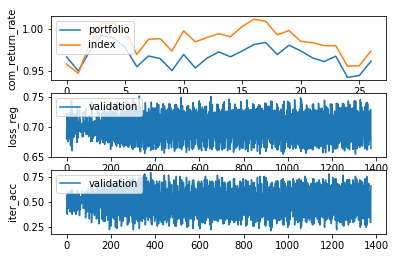

Epochs :  50 Iterations :  27 Loss :  0.6996874544355605 ACC :  0.4958605815966924 MCC :  nan Precision :  0.49082047423278846


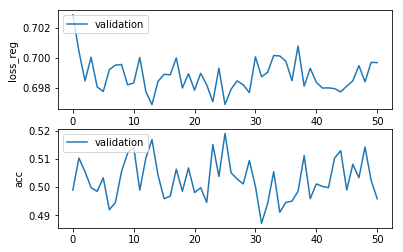

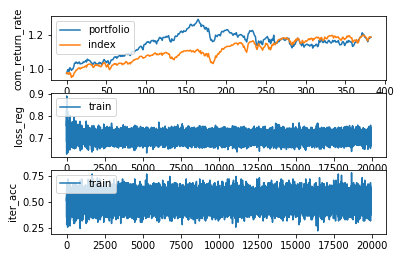

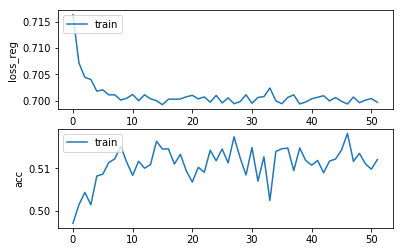

Epochs :  51 Iterations :  19916 Loss :  0.6996671117005709 ACC :  0.5120872536153769 MCC :  0.024137890534463288 Precision :  0.521180576525687
mode : validation


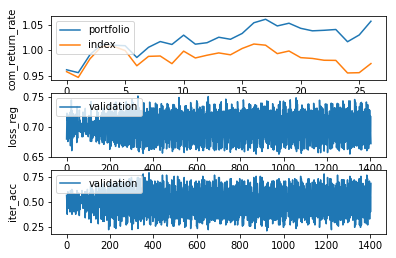

Epochs :  51 Iterations :  27 Loss :  0.6974769234657288 ACC :  0.5185185328677848 MCC :  nan Precision :  0.5003128131782567


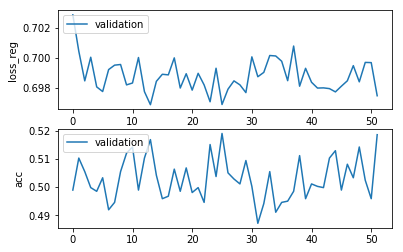

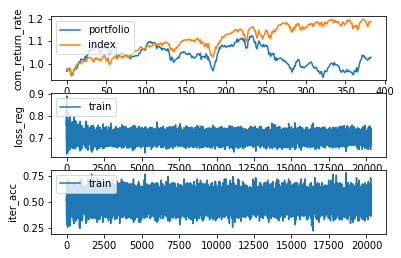

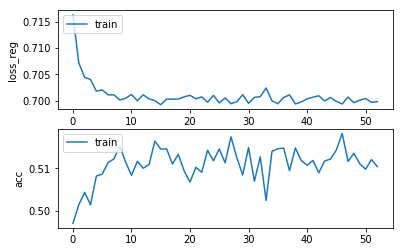

Epochs :  52 Iterations :  20299 Loss :  0.6997927405504272 ACC :  0.5104285213250093 MCC :  0.01912225335903281 Precision :  0.5186101898998411
mode : validation


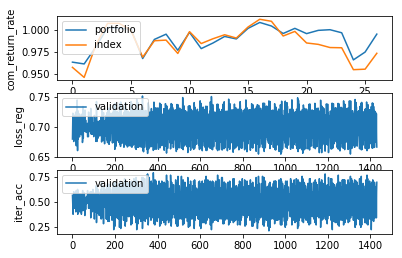

Epochs :  52 Iterations :  27 Loss :  0.6994275649388632 ACC :  0.503703718384107 MCC :  nan Precision :  0.4964606641895241


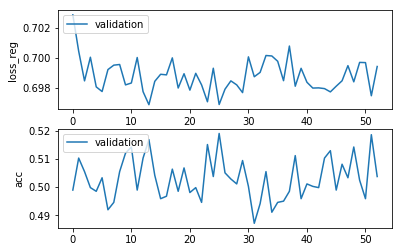

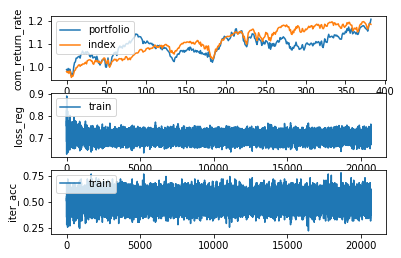

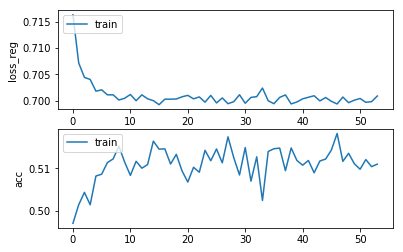

Epochs :  53 Iterations :  20682 Loss :  0.7008661176454928 ACC :  0.5110121493862441 MCC :  0.023693310264035983 Precision :  0.5196423728077358
mode : validation


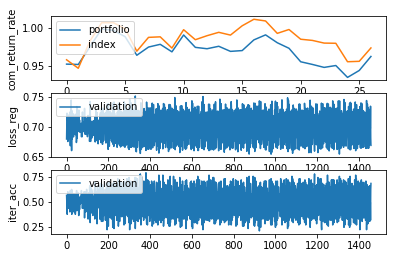

Epochs :  53 Iterations :  27 Loss :  0.6981907023323907 ACC :  0.490196093916893 MCC :  nan Precision :  0.489989278562091


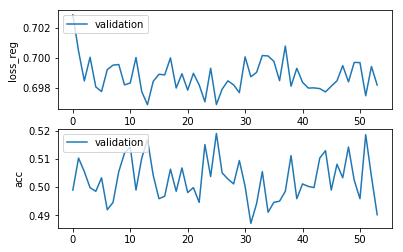

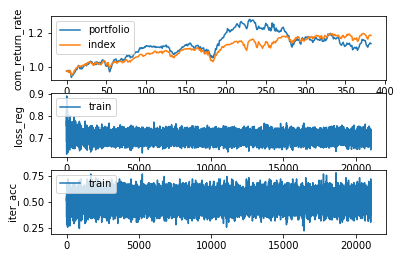

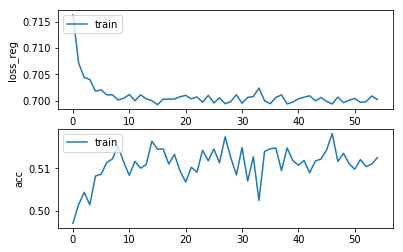

Epochs :  54 Iterations :  21065 Loss :  0.700204726610109 ACC :  0.5125480119148683 MCC :  0.022358262440002483 Precision :  0.5198474689520526
mode : validation


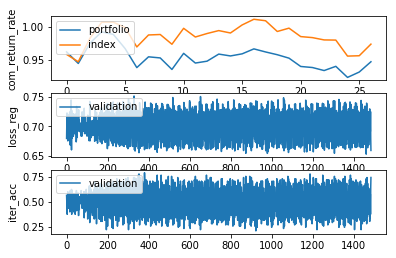

Epochs :  54 Iterations :  27 Loss :  0.6980433000458611 ACC :  0.5076252862259194 MCC :  nan Precision :  0.49365088495391385


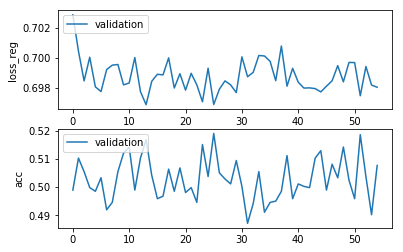

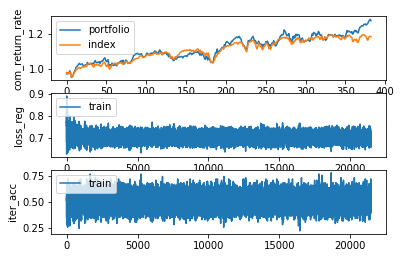

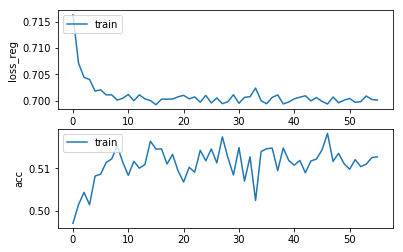

Epochs :  55 Iterations :  21448 Loss :  0.7000904936080813 ACC :  0.5127323153124776 MCC :  0.02358898643769601 Precision :  0.5204610295068501
mode : validation


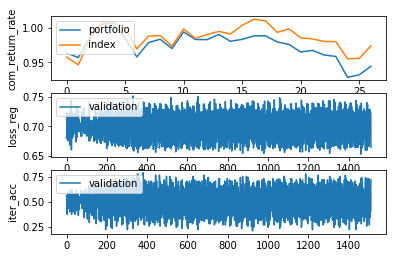

Epochs :  55 Iterations :  27 Loss :  0.6992222181072941 ACC :  0.5080610171512321 MCC :  nan Precision :  0.495965880514295


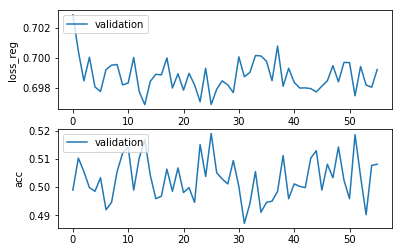

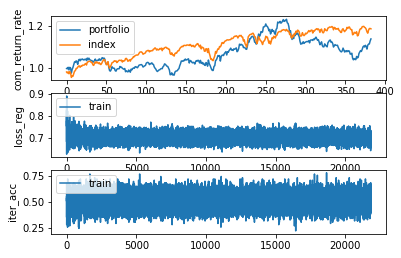

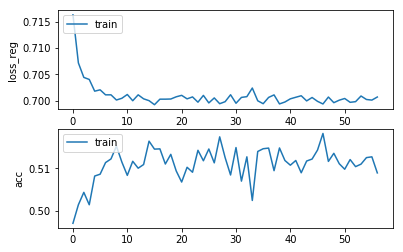

Epochs :  56 Iterations :  21831 Loss :  0.7006745996736671 ACC :  0.5089540933660054 MCC :  0.018072109865802814 Precision :  0.5184330479108167
mode : validation


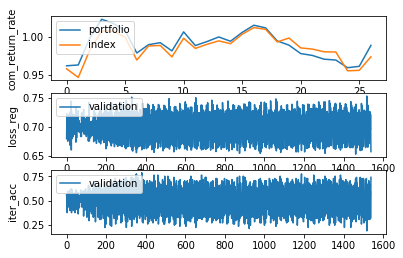

Epochs :  56 Iterations :  27 Loss :  0.6992045022823192 ACC :  0.4919390132029851 MCC :  nan Precision :  0.4888879387742943


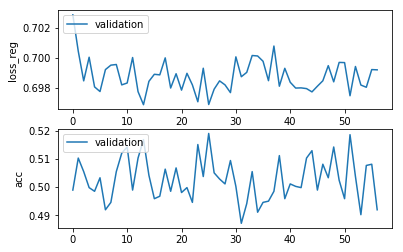

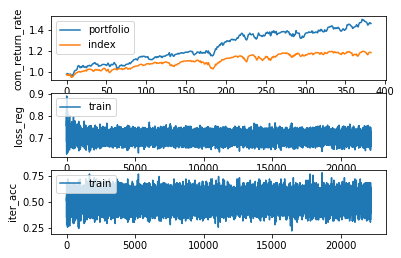

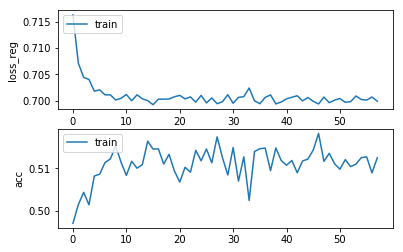

Epochs :  57 Iterations :  22214 Loss :  0.6998749647688305 ACC :  0.5125172939686489 MCC :  0.026531828032422315 Precision :  0.5210654078289749
mode : validation


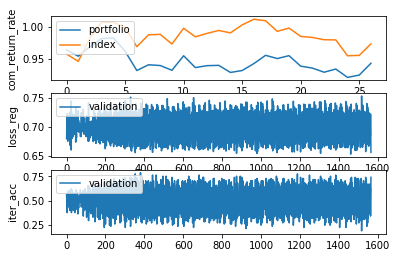

Epochs :  57 Iterations :  27 Loss :  0.6972521455199631 ACC :  0.5137255042791367 MCC :  nan Precision :  0.5009945120524477


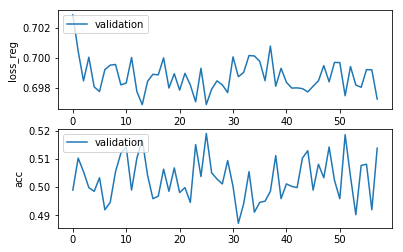

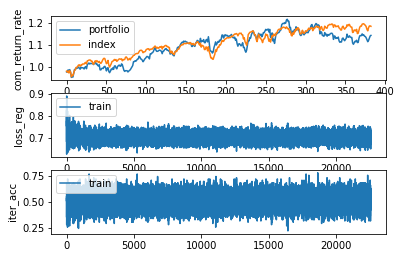

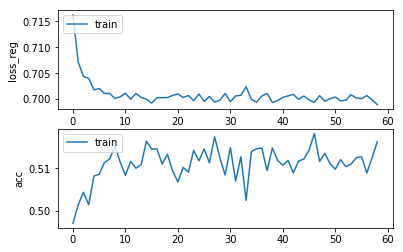

Epochs :  58 Iterations :  22597 Loss :  0.6989163415550251 ACC :  0.5162647994473459 MCC :  0.03240384267978662 Precision :  0.524063620405082
mode : validation


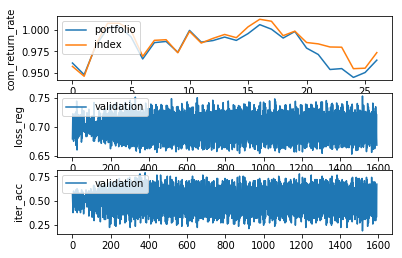

Epochs :  58 Iterations :  27 Loss :  0.6990850236680772 ACC :  0.48976036464726486 MCC :  nan Precision :  0.4925355745686425


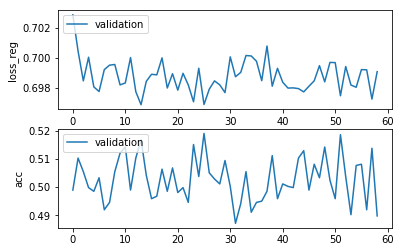

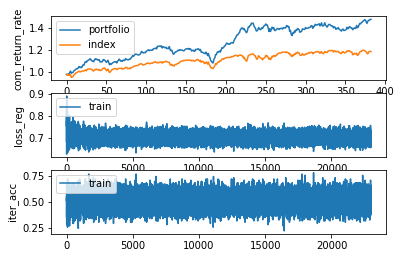

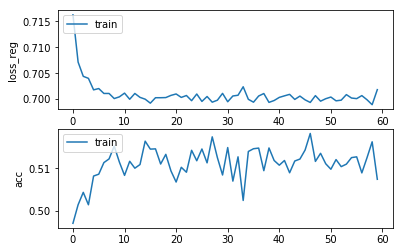

Epochs :  59 Iterations :  22980 Loss :  0.7018277158002629 ACC :  0.5074489480832849 MCC :  0.0145328883336998 Precision :  0.5167860038597963
mode : validation


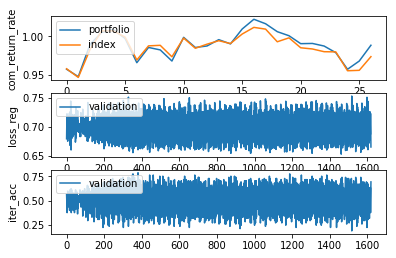

Epochs :  59 Iterations :  27 Loss :  0.6999403083765948 ACC :  0.5023965300233276 MCC :  nan Precision :  0.4926851678777624


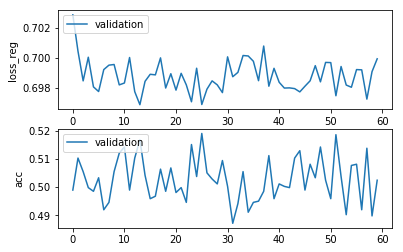

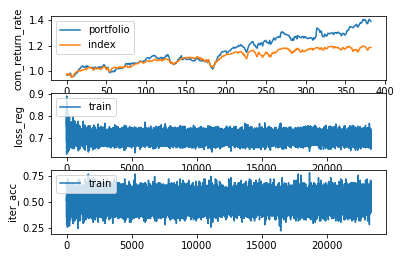

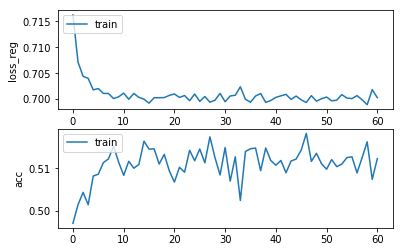

Epochs :  60 Iterations :  23363 Loss :  0.7002717654947823 ACC :  0.5123022736363871 MCC :  0.020040229217309805 Precision :  0.5189860550438689
mode : validation


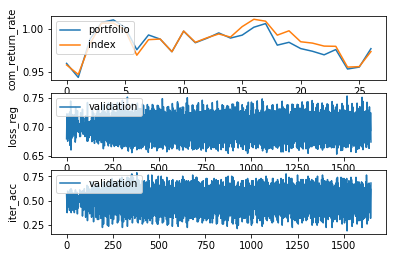

Epochs :  60 Iterations :  27 Loss :  0.7002301282352872 ACC :  0.5006536090815509 MCC :  nan Precision :  0.49423488733117227


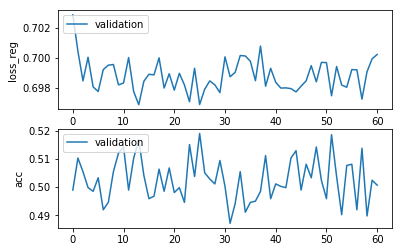

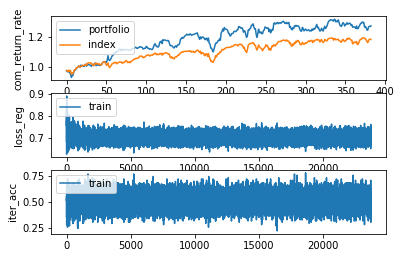

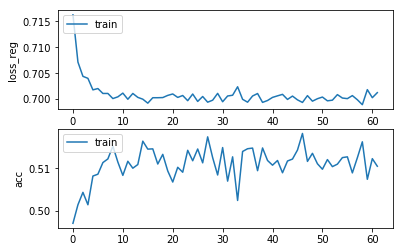

Epochs :  61 Iterations :  23746 Loss :  0.7012459168857444 ACC :  0.5105206736074104 MCC :  0.02463619664688923 Precision :  0.5207094936327663
mode : validation


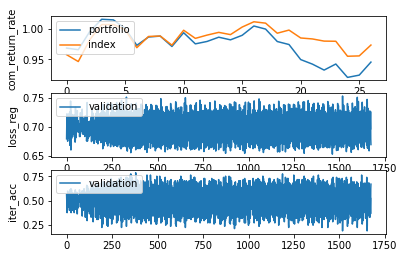

Epochs :  61 Iterations :  27 Loss :  0.699586980872684 ACC :  0.4993464196169818 MCC :  nan Precision :  0.49148532596451266


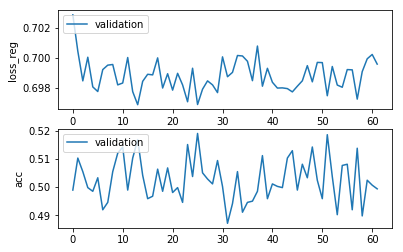

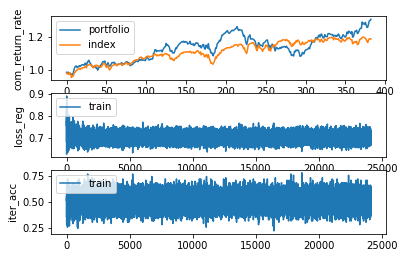

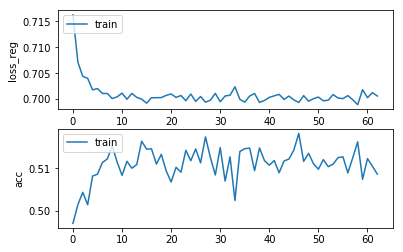

Epochs :  62 Iterations :  24129 Loss :  0.7005991005088268 ACC :  0.5086776390866262 MCC :  0.015044927368470646 Precision :  0.5176142598392913
mode : validation


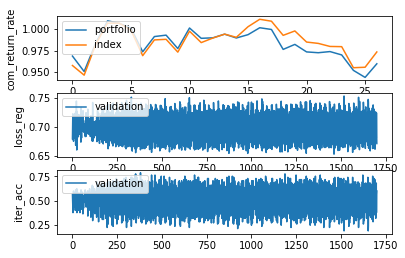

Epochs :  62 Iterations :  27 Loss :  0.6980744423689665 ACC :  0.5167756146854825 MCC :  nan Precision :  0.4972193368055202


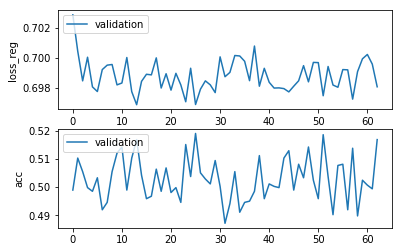

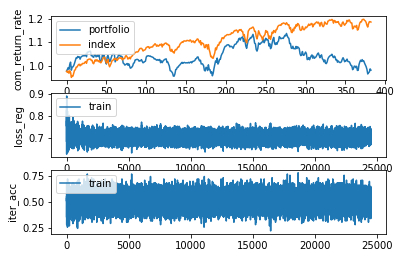

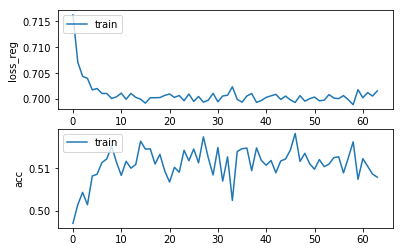

Epochs :  63 Iterations :  24512 Loss :  0.7015848262503004 ACC :  0.5079404240955572 MCC :  0.0181683872920016 Precision :  0.5181065444973134
mode : validation


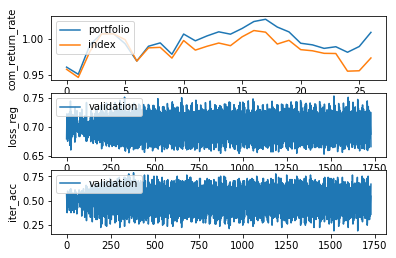

Epochs :  63 Iterations :  27 Loss :  0.697966957533801 ACC :  0.49934642016887665 MCC :  nan Precision :  0.4916055461874715


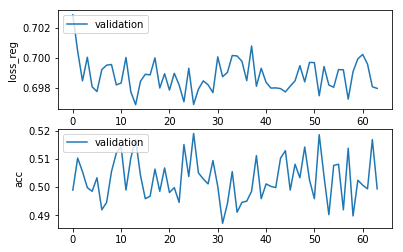

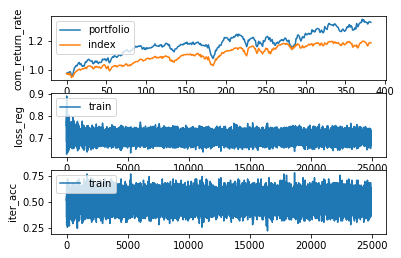

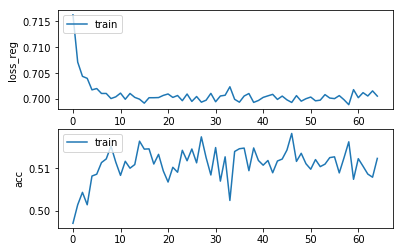

Epochs :  64 Iterations :  24895 Loss :  0.7005740449260482 ACC :  0.5123637085172589 MCC :  0.025884250965572446 Precision :  0.52036442966553
mode : validation


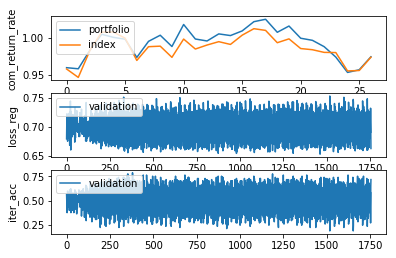

Epochs :  64 Iterations :  27 Loss :  0.698284301492903 ACC :  0.50413944820563 MCC :  nan Precision :  0.4886862543170099


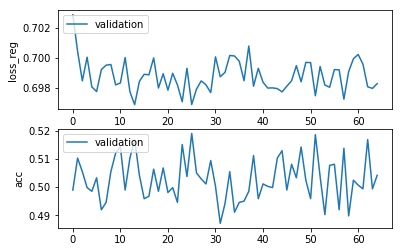

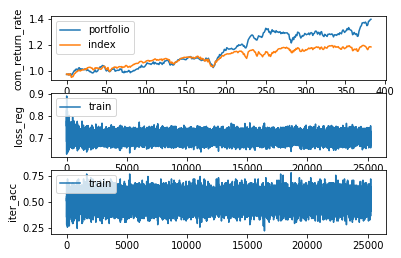

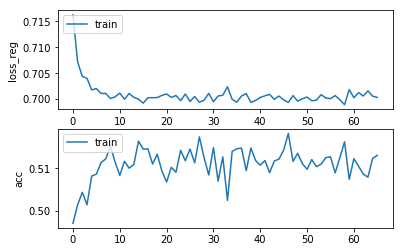

Epochs :  65 Iterations :  25278 Loss :  0.7003228952305747 ACC :  0.5130702051730442 MCC :  0.02768242950751823 Precision :  0.5219667084981972
mode : validation


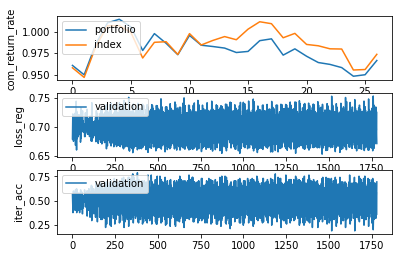

Epochs :  65 Iterations :  27 Loss :  0.7013463929847434 ACC :  0.4945533921321233 MCC :  nan Precision :  0.4927820550898711


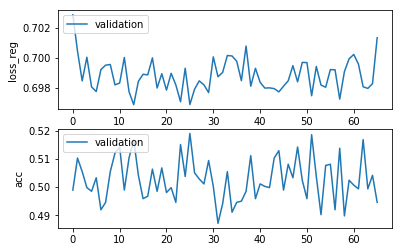

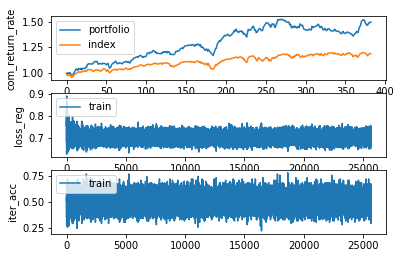

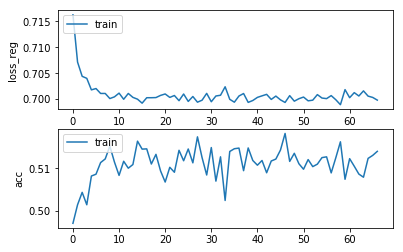

Epochs :  66 Iterations :  25661 Loss :  0.6998019775584846 ACC :  0.5140224392513694 MCC :  0.02592720670972686 Precision :  0.5210065244461164
mode : validation


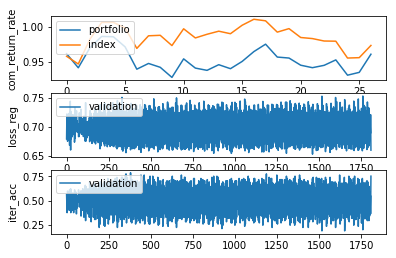

Epochs :  66 Iterations :  27 Loss :  0.6980226635932922 ACC :  0.4989106908992485 MCC :  nan Precision :  0.4910345418309724


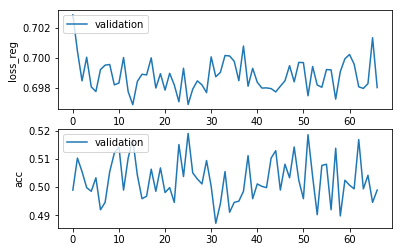

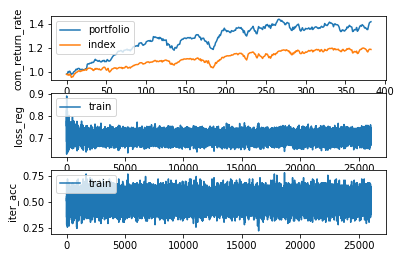

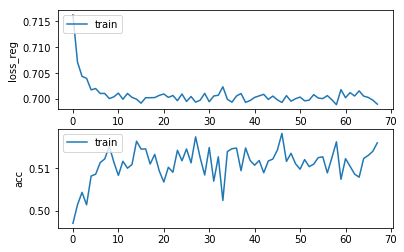

Epochs :  67 Iterations :  26044 Loss :  0.6990263753086717 ACC :  0.5160190620248063 MCC :  0.029903328294535084 Precision :  0.5230007665353407
mode : validation


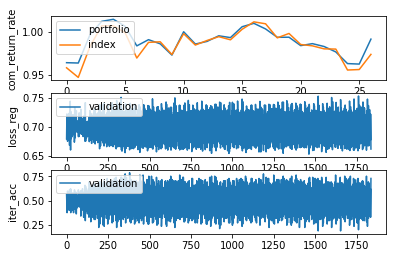

Epochs :  67 Iterations :  27 Loss :  0.6998029086324904 ACC :  0.4932462015637645 MCC :  nan Precision :  0.49004224301488314


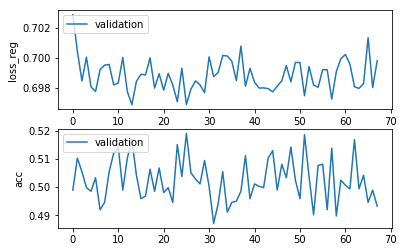

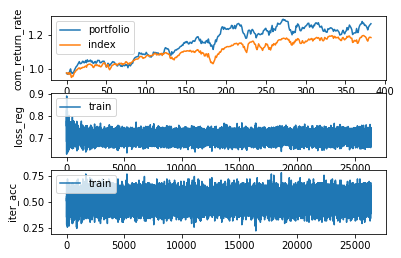

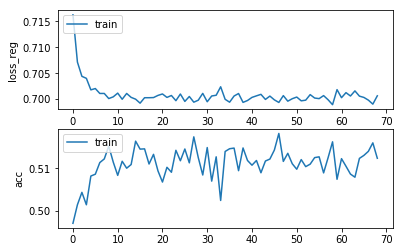

Epochs :  68 Iterations :  26427 Loss :  0.7006341192491995 ACC :  0.5123944250628469 MCC :  0.020674451675895825 Precision :  0.5188302131802544
mode : validation


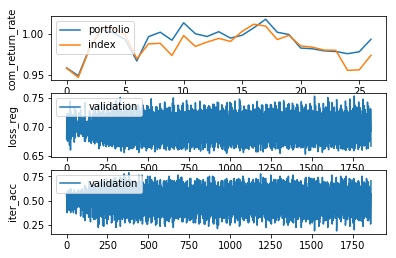

Epochs :  68 Iterations :  27 Loss :  0.7004576413719742 ACC :  0.4962963130739 MCC :  nan Precision :  0.49091276719614313


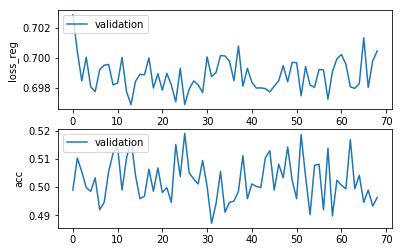

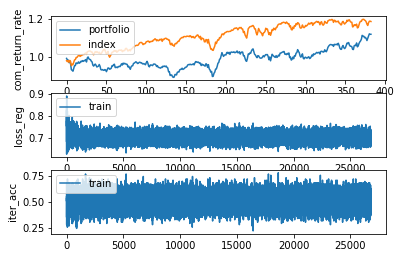

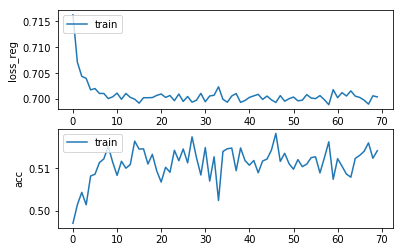

Epochs :  69 Iterations :  26810 Loss :  0.7004240980036265 ACC :  0.5141760268815192 MCC :  0.025629193739972852 Precision :  0.5215276878998267
mode : validation


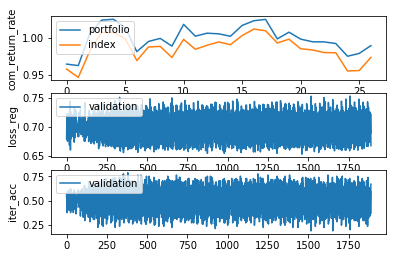

Epochs :  69 Iterations :  27 Loss :  0.6995139188236661 ACC :  0.49803923070430756 MCC :  nan Precision :  0.494079929397062


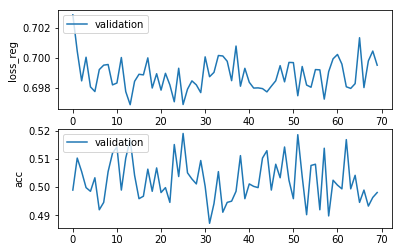

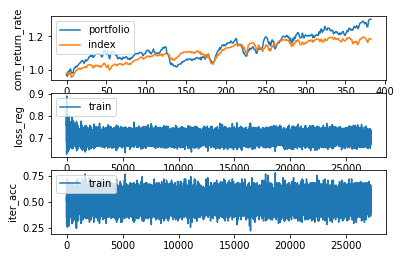

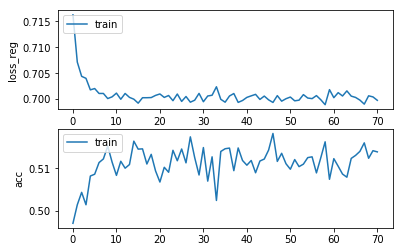

Epochs :  70 Iterations :  27193 Loss :  0.6997623795317608 ACC :  0.5138995706568188 MCC :  0.024393030214482095 Precision :  0.5204118314653868
mode : validation


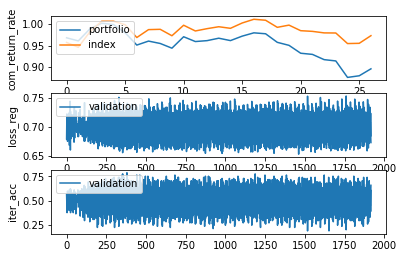

Epochs :  70 Iterations :  27 Loss :  0.6991078677000823 ACC :  0.5080610182550218 MCC :  nan Precision :  0.4950626562177031


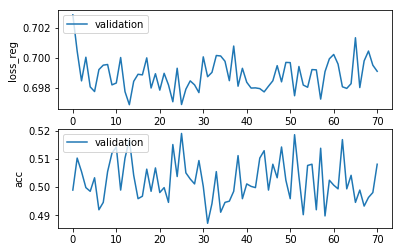

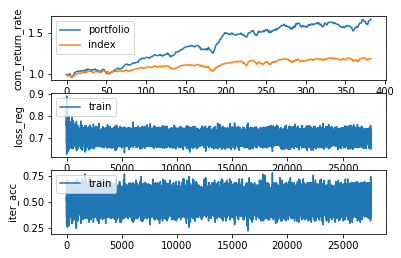

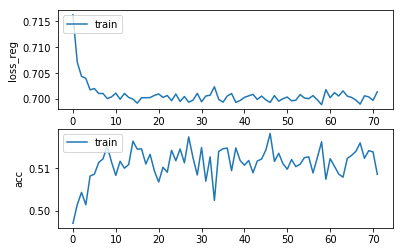

Epochs :  71 Iterations :  27576 Loss :  0.7014176087653357 ACC :  0.5086162042835674 MCC :  0.017999783390221083 Precision :  0.5183194159206693
mode : validation


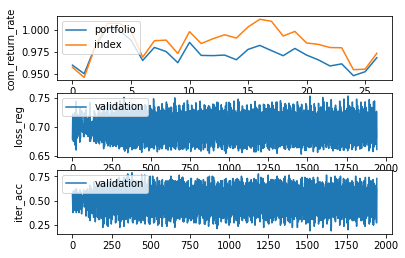

Epochs :  71 Iterations :  27 Loss :  0.6980699322841786 ACC :  0.50413944820563 MCC :  nan Precision :  0.4962696725571597


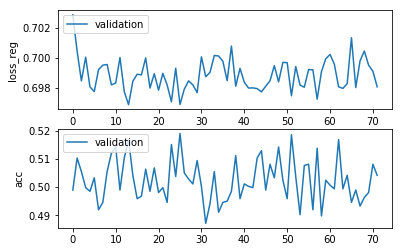

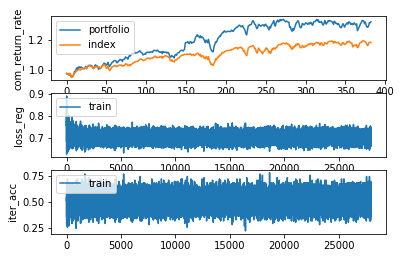

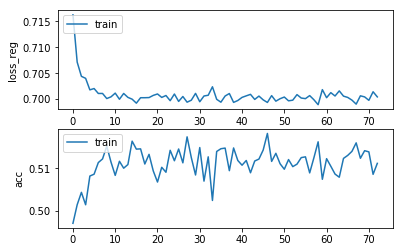

Epochs :  72 Iterations :  27959 Loss :  0.7004260532849762 ACC :  0.5111964534063563 MCC :  0.019035696438799415 Precision :  0.5192945624358816
mode : validation


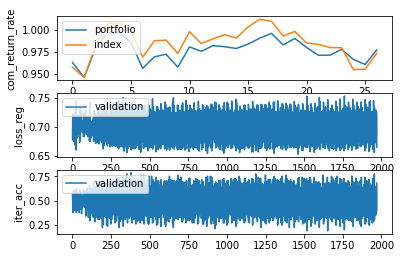

Epochs :  72 Iterations :  27 Loss :  0.6979021098878648 ACC :  0.5045751785790479 MCC :  nan Precision :  0.49605605930641844


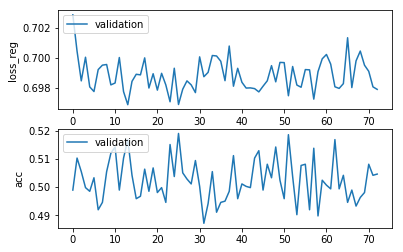

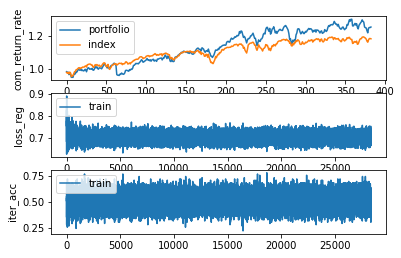

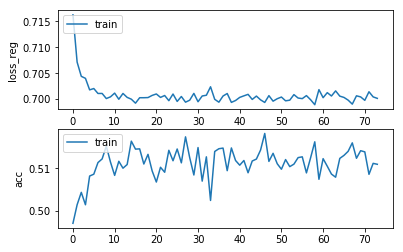

Epochs :  73 Iterations :  28342 Loss :  0.7001415982881352 ACC :  0.5109814315178376 MCC :  0.018439071849912562 Precision :  0.5182820053104865
mode : validation


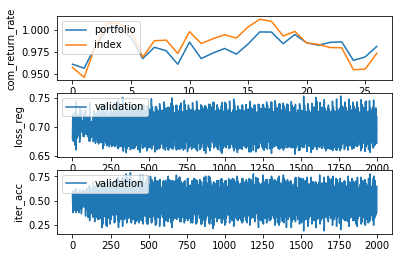

Epochs :  73 Iterations :  27 Loss :  0.6991076359042415 ACC :  0.5028322587410609 MCC :  nan Precision :  0.4947842530630253


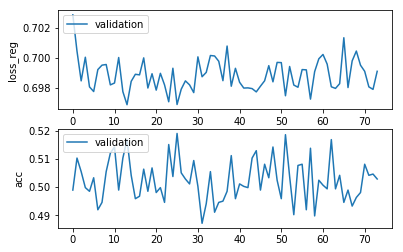

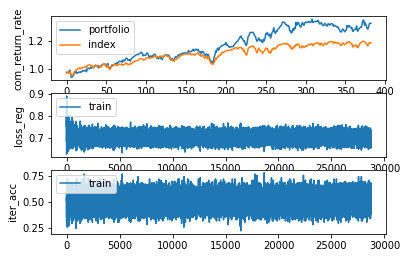

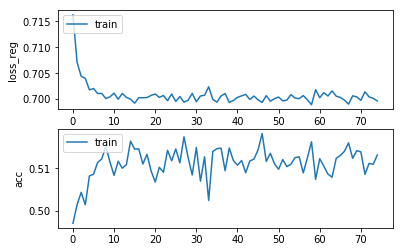

Epochs :  74 Iterations :  28725 Loss :  0.6996420525384012 ACC :  0.513162357066381 MCC :  0.026154210966678613 Precision :  0.5212799378089588
mode : validation


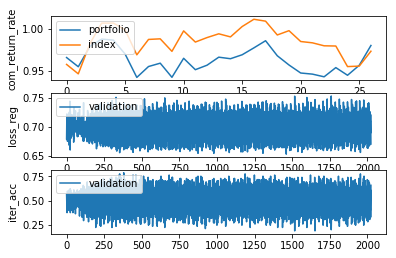

Epochs :  74 Iterations :  27 Loss :  0.6999885484024331 ACC :  0.4936819319371824 MCC :  nan Precision :  0.48903914982521973


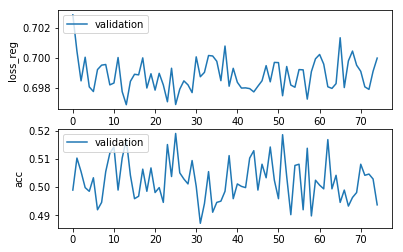

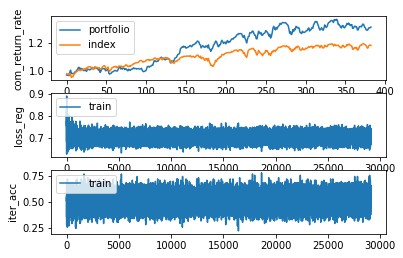

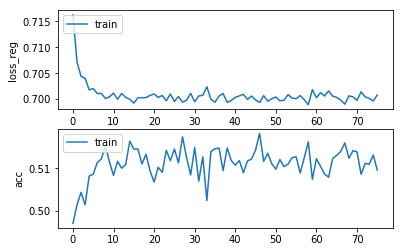

Epochs :  75 Iterations :  29108 Loss :  0.7007947400718072 ACC :  0.5095991560746733 MCC :  0.01765364295618813 Precision :  0.5184786385970857
mode : validation


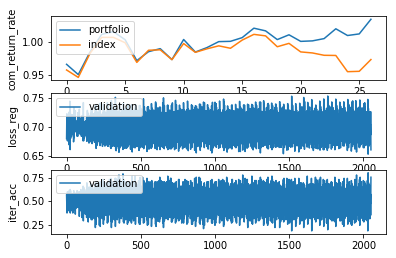

Epochs :  75 Iterations :  27 Loss :  0.6972379596145065 ACC :  0.5015250703802815 MCC :  nan Precision :  0.4934437313565501


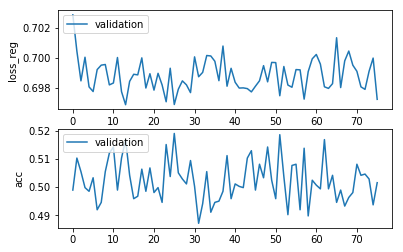

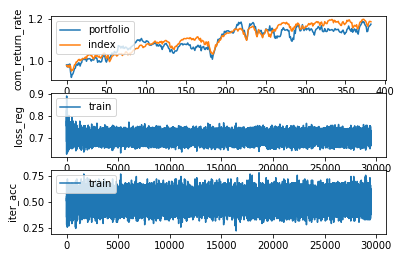

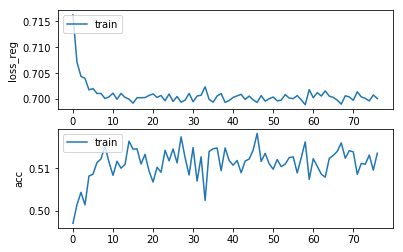

Epochs :  76 Iterations :  29491 Loss :  0.7001183359803481 ACC :  0.5135923988980973 MCC :  0.022199615137651563 Precision :  0.5200943290827402
mode : validation


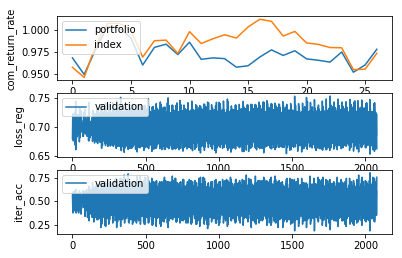

Epochs :  76 Iterations :  27 Loss :  0.6973265299090633 ACC :  0.5176470732247388 MCC :  nan Precision :  0.497022646030894


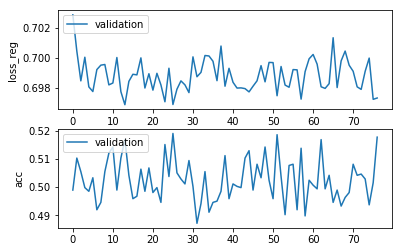

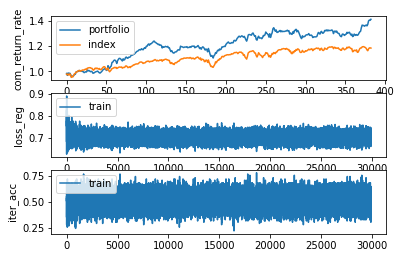

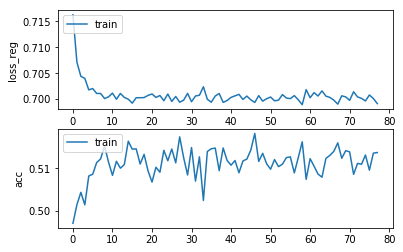

Epochs :  77 Iterations :  29874 Loss :  0.6991249243522126 ACC :  0.513745984505113 MCC :  0.024832080265928994 Precision :  0.5213421683359707
mode : validation


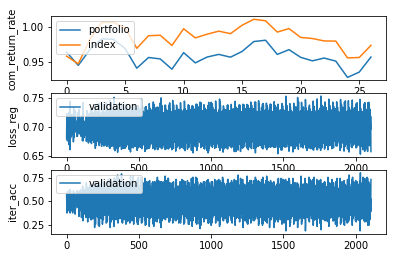

Epochs :  77 Iterations :  27 Loss :  0.6987570347609343 ACC :  0.502396528367643 MCC :  nan Precision :  0.4894993989555924


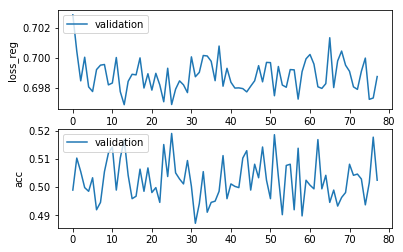

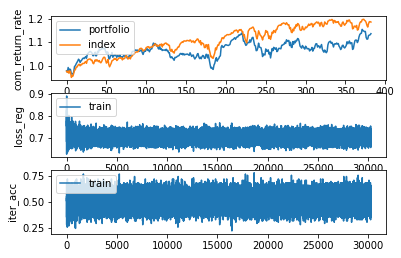

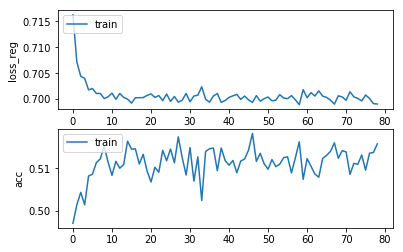

Epochs :  78 Iterations :  30257 Loss :  0.6990499740792316 ACC :  0.5157733231238223 MCC :  0.030330713162643654 Precision :  0.5232610650720468
mode : validation


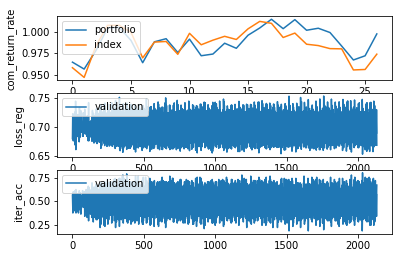

Epochs :  78 Iterations :  27 Loss :  0.6990560911319874 ACC :  0.5063180973132452 MCC :  nan Precision :  0.49374379231422033


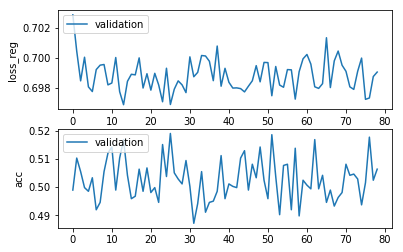

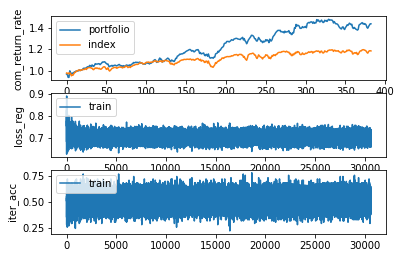

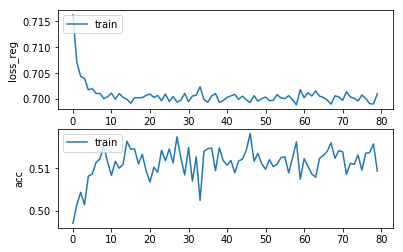

Epochs :  79 Iterations :  30640 Loss :  0.7010308778005854 ACC :  0.5093841348864703 MCC :  0.019395268434359552 Precision :  0.5189826637457852
mode : validation


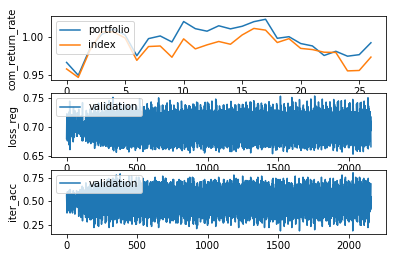

Epochs :  79 Iterations :  27 Loss :  0.6992714824499907 ACC :  0.49629631141821545 MCC :  nan Precision :  0.4918004700707065


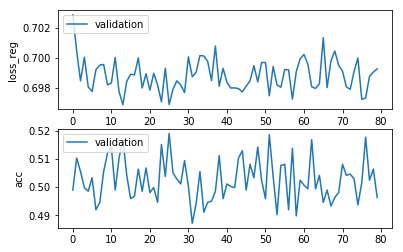

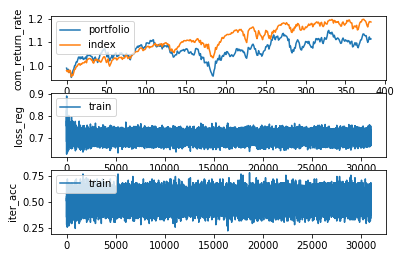

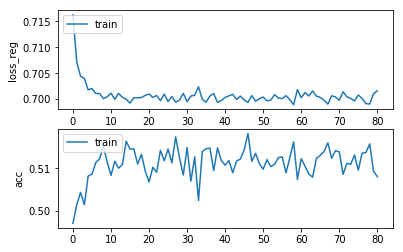

Epochs :  80 Iterations :  31023 Loss :  0.7016033729436192 ACC :  0.5080632935460492 MCC :  0.01379812760603816 Precision :  0.5164630302172105
mode : validation


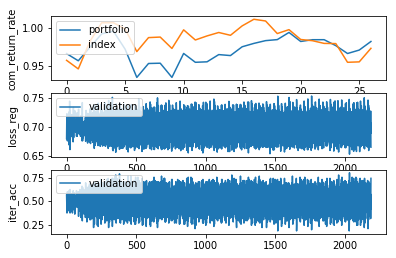

Epochs :  80 Iterations :  27 Loss :  0.6976158089107938 ACC :  0.5111111264537882 MCC :  nan Precision :  0.49674410704109406


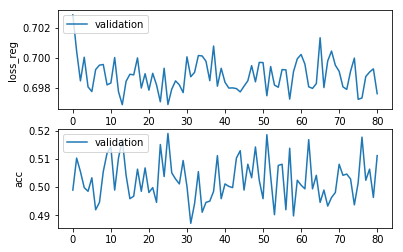

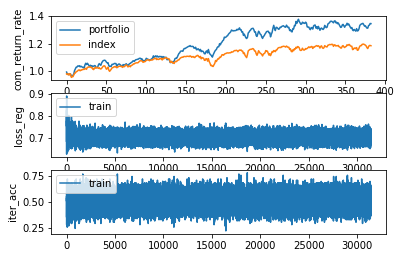

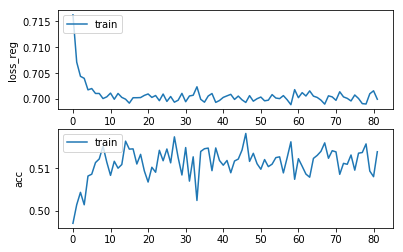

Epochs :  81 Iterations :  31406 Loss :  0.6999730084957093 ACC :  0.5139302879027224 MCC :  0.028500168172730128 Precision :  0.5224152885805378
mode : validation


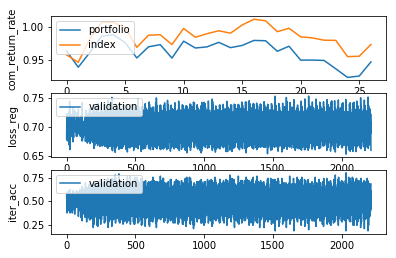

Epochs :  81 Iterations :  27 Loss :  0.6997402067537661 ACC :  0.4989106908992485 MCC :  nan Precision :  0.4921230119825513


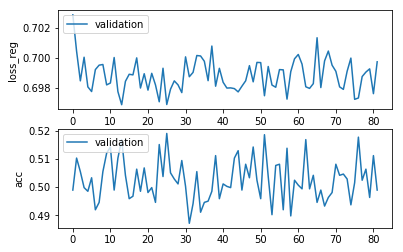

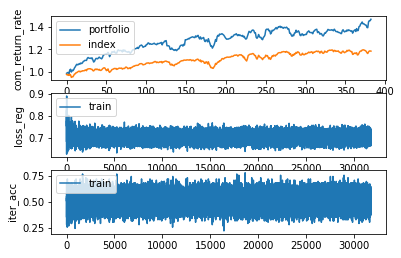

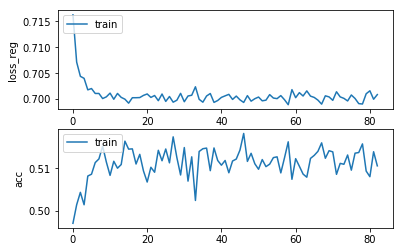

Epochs :  82 Iterations :  31789 Loss :  0.7008705140716414 ACC :  0.5106128251894958 MCC :  0.02047096784305625 Precision :  0.51901937214361
mode : validation


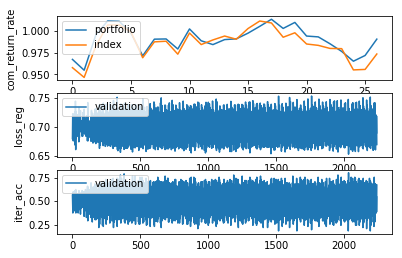

Epochs :  82 Iterations :  27 Loss :  0.6991529862085978 ACC :  0.49673204123973846 MCC :  nan Precision :  0.4890630054805014


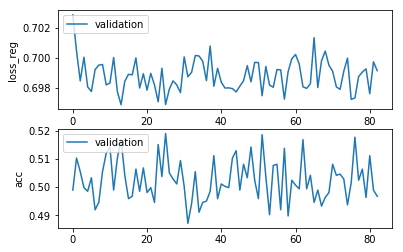

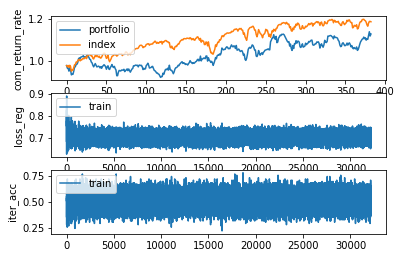

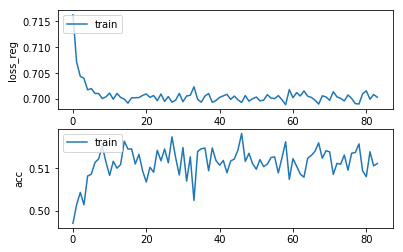

Epochs :  83 Iterations :  32172 Loss :  0.7003739888612035 ACC :  0.5111657356157626 MCC :  0.018519062466199655 Precision :  0.5187622603739055
mode : validation


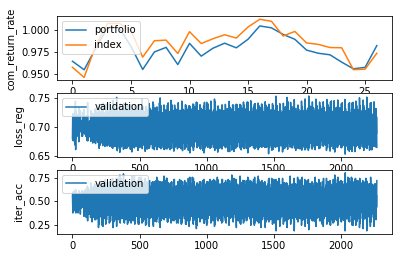

Epochs :  83 Iterations :  27 Loss :  0.6979802626150625 ACC :  0.5019607990980148 MCC :  nan Precision :  0.49458325185157637


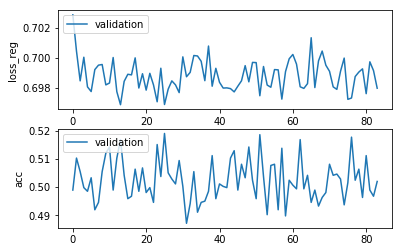

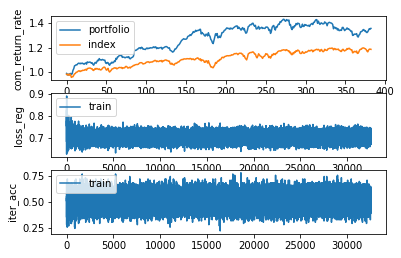

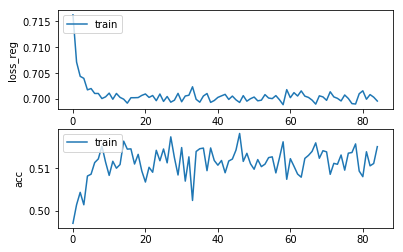

Epochs :  84 Iterations :  32555 Loss :  0.6996220032789066 ACC :  0.5151282602595287 MCC :  0.026943840249988686 Precision :  0.5215124289454119
mode : validation


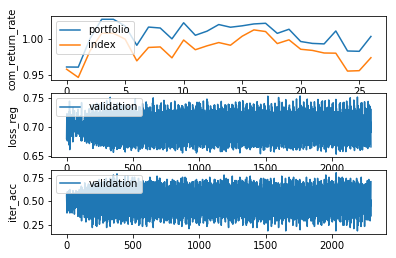

Epochs :  84 Iterations :  27 Loss :  0.6986742328714441 ACC :  0.5006536101853406 MCC :  nan Precision :  0.49340927931997514


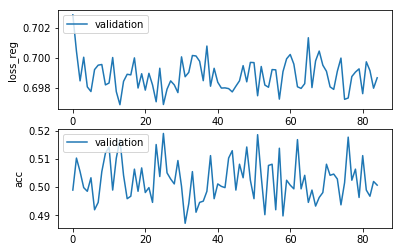

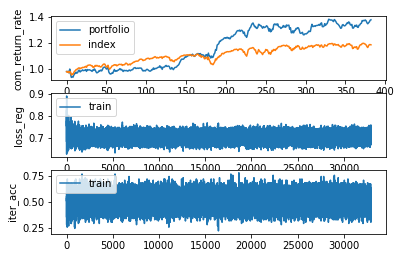

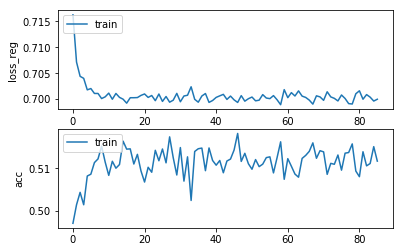

Epochs :  85 Iterations :  32938 Loss :  0.6999710897864001 ACC :  0.5117186471314094 MCC :  0.016667176130733527 Precision :  0.5186856764638627
mode : validation


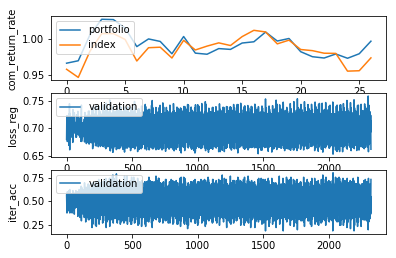

Epochs :  85 Iterations :  27 Loss :  0.6992323972560741 ACC :  0.5002178809157124 MCC :  nan Precision :  0.4953446883570265


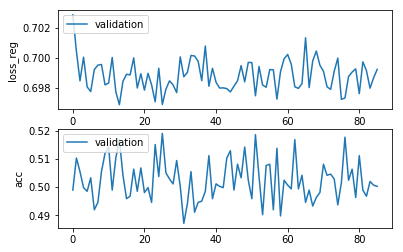

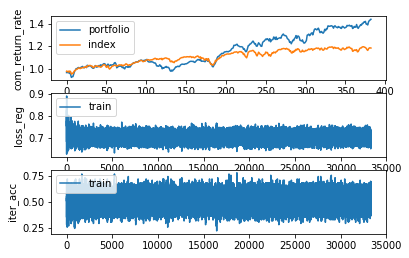

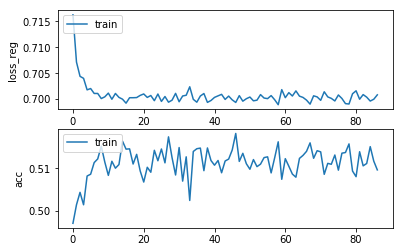

Epochs :  86 Iterations :  33321 Loss :  0.700820809400424 ACC :  0.5096605901774165 MCC :  0.01634106752839591 Precision :  0.5178779918535105
mode : validation


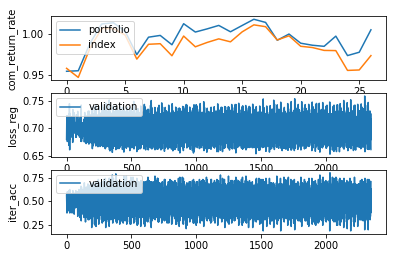

Epochs :  86 Iterations :  27 Loss :  0.698724455303616 ACC :  0.5006536096334457 MCC :  nan Precision :  0.49000202602258436


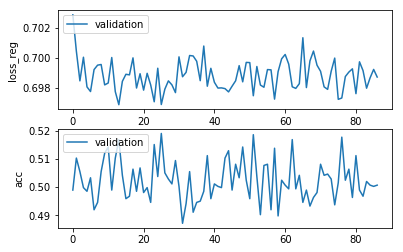

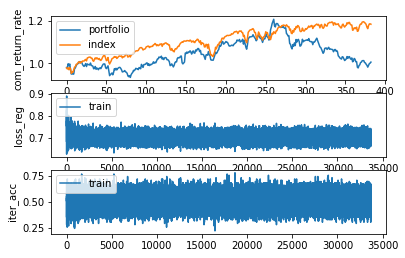

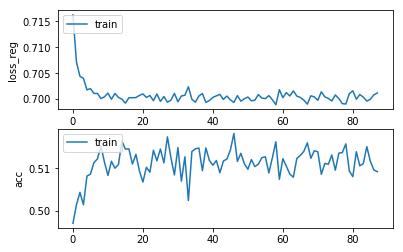

Epochs :  87 Iterations :  33704 Loss :  0.7011778462026511 ACC :  0.509230549512893 MCC :  0.015611076159414886 Precision :  0.5178497510259441
mode : validation


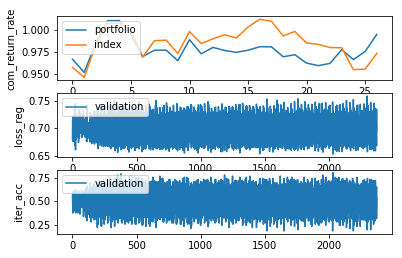

Epochs :  87 Iterations :  27 Loss :  0.699164401601862 ACC :  0.49803923235999215 MCC :  nan Precision :  0.4943080246448517


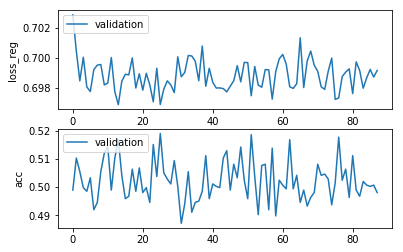

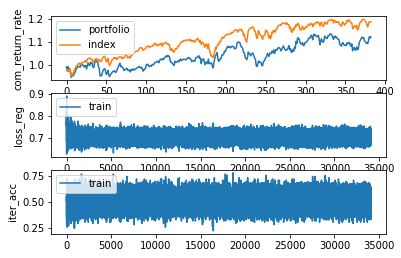

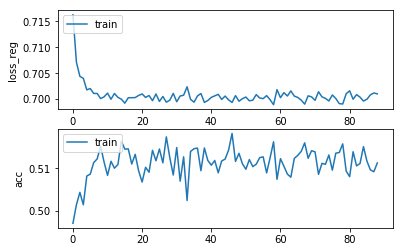

Epochs :  88 Iterations :  34087 Loss :  0.701017755752444 ACC :  0.5112886052218804 MCC :  0.018896860914309716 Precision :  0.5188539460612651
mode : validation


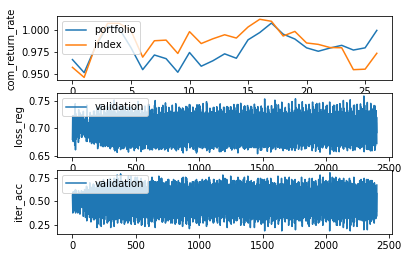

Epochs :  88 Iterations :  27 Loss :  0.7000255032821938 ACC :  0.4976035014346794 MCC :  nan Precision :  0.4925517428804327


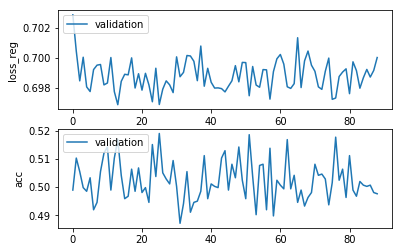

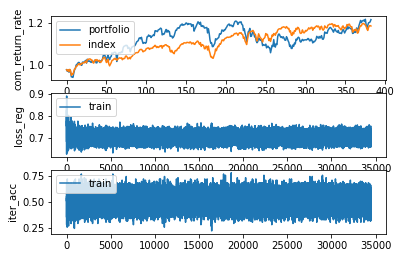

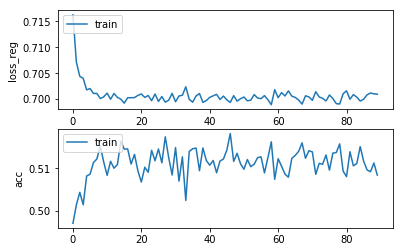

Epochs :  89 Iterations :  34470 Loss :  0.7009508584871615 ACC :  0.5084319005747066 MCC :  0.017698463817265652 Precision :  0.5185020574205615
mode : validation


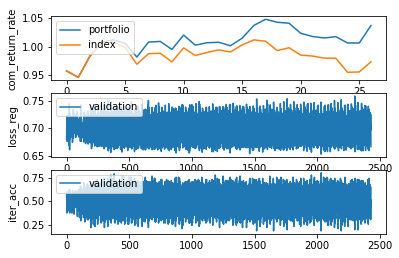

Epochs :  89 Iterations :  27 Loss :  0.6983391068599842 ACC :  0.5089324767942782 MCC :  nan Precision :  0.4932069422470199


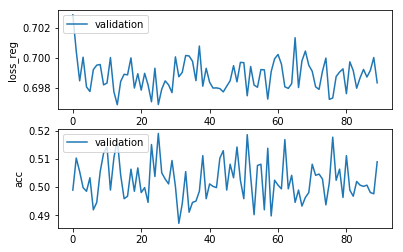

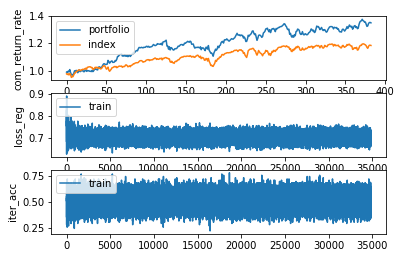

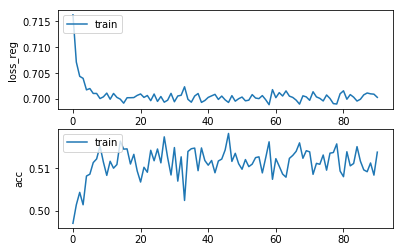

Epochs :  90 Iterations :  34853 Loss :  0.7003351677179959 ACC :  0.5138381361650113 MCC :  0.025529345169519962 Precision :  0.5210302988791902
mode : validation


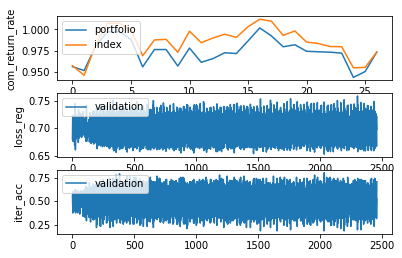

Epochs :  90 Iterations :  27 Loss :  0.6987978330364933 ACC :  0.5076252867778143 MCC :  nan Precision :  0.4948436751685761


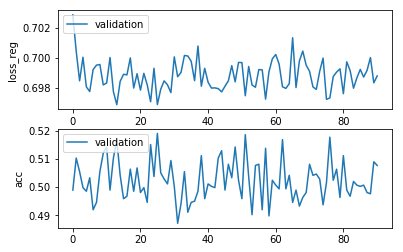

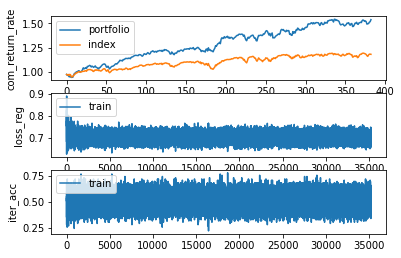

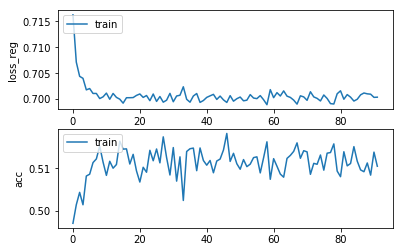

Epochs :  91 Iterations :  35236 Loss :  0.7003696786516952 ACC :  0.5105206732183462 MCC :  0.01883909154568456 Precision :  0.5170496998758447
mode : validation


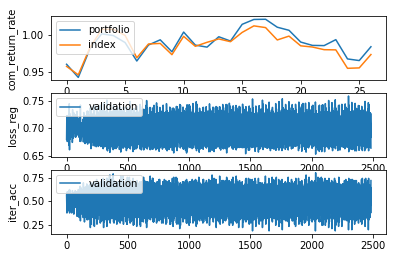

Epochs :  91 Iterations :  27 Loss :  0.6990752926579228 ACC :  0.5076252867778143 MCC :  nan Precision :  0.49679240694752447


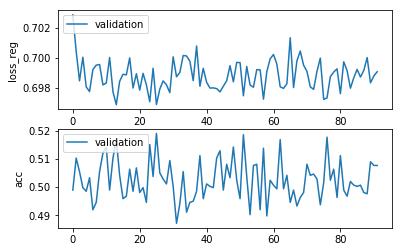

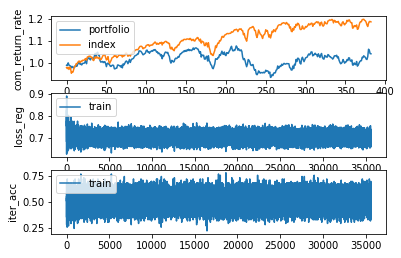

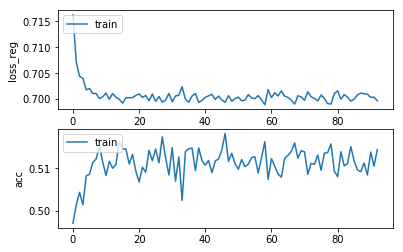

Epochs :  92 Iterations :  35619 Loss :  0.6996854243328303 ACC :  0.5144217646931233 MCC :  0.026309096878734915 Precision :  0.521434361163731
mode : validation


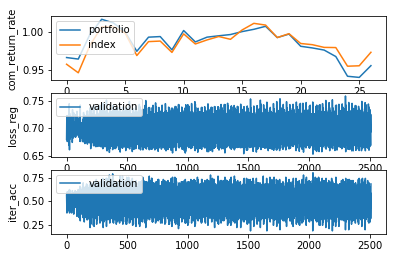

Epochs :  92 Iterations :  27 Loss :  0.6984938692163538 ACC :  0.4976035014346794 MCC :  nan Precision :  0.49505228328484074


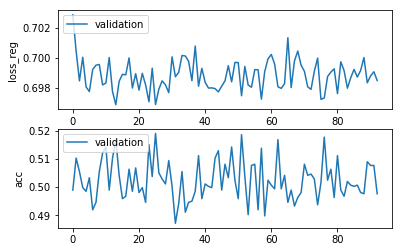

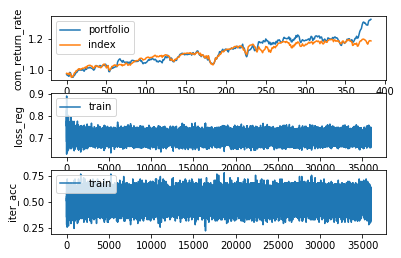

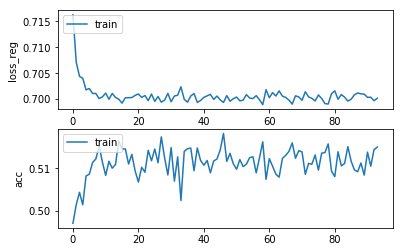

Epochs :  93 Iterations :  36002 Loss :  0.7001756537053977 ACC :  0.5150361105449517 MCC :  0.026950283377861737 Precision :  0.5222374459840454
mode : validation


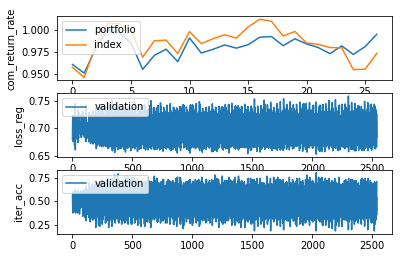

Epochs :  93 Iterations :  27 Loss :  0.6989002647223296 ACC :  0.4923747430245082 MCC :  nan Precision :  0.4911726721458965


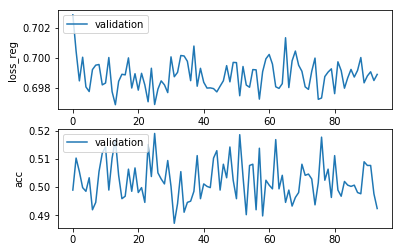

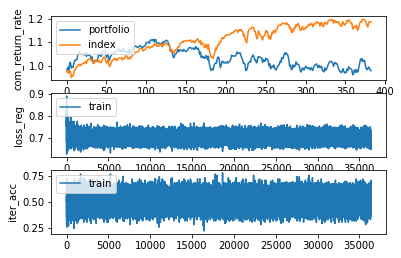

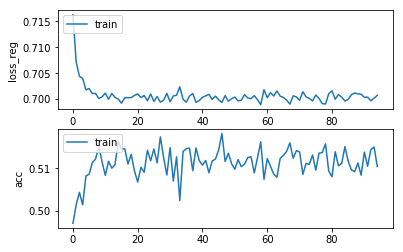

Epochs :  94 Iterations :  36385 Loss :  0.700719190328613 ACC :  0.5104592381818488 MCC :  0.02031185989925886 Precision :  0.5182778697032919
mode : validation


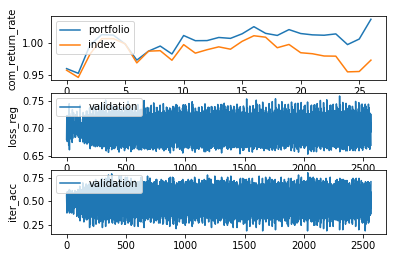

Epochs :  94 Iterations :  27 Loss :  0.6983255015479194 ACC :  0.506753827686663 MCC :  nan Precision :  0.499299462194796


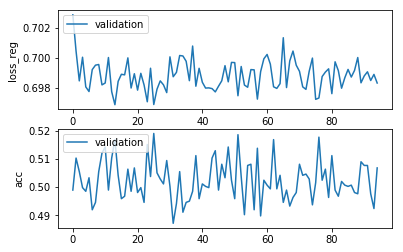

KeyboardInterrupt: 

In [22]:
model.train()

epoch :  0 time_idx :  0 loss_reg :  tensor(0.6731, grad_fn=<AddBackward0>) acc :  tensor(0.6471) mcc :  tensor(0.1364) precision :  tensor(0.9259)


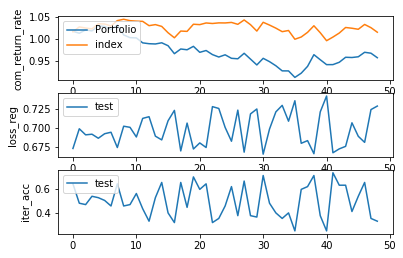

Epochs :  0 Iterations :  49 Loss :  0.6977355772135209 ACC :  0.5003601574167913 MCC :  0.02746203467630002 Precision :  0.48246878974747903


In [23]:
model.test()

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.train() # dropout 없음, epochs = 5

In [ ]:
model.train() # dropout 0.15 적용

In [ ]:
model.test()

In [ ]:
model.test()

In [ ]:
model.train()

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.epoch_losses

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.return_rate.shape

In [ ]:
ㄴmodel.train()

In [ ]:
model.train()